In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import TimeSeriesSplit
from typing import List, Dict, Tuple, Optional, Union

from pvc.round_executor import load_raw_data, train_clear_sky_model, compute_metrics

import warnings
warnings.filterwarnings('ignore')

latitude=39.7420
longitude=-105.1778
altitude=1829
timezone='America/Denver'
raw_file_path = './Clearsky-Labeled-Data-Set/labeled_clearsky_data.csv'

Dataset shape: (1050293, 7)

Data types:
measured_on           datetime64[ns]
direct_normal                float64
global_normal                float64
global_horizontal            float64
diffuse_horizontal           float64
poa_irradiance               float64
clearsky_label                 int64
dtype: object

Missing values:
measured_on              0
direct_normal         9529
global_normal         9529
global_horizontal     9529
diffuse_horizontal    9529
poa_irradiance          12
clearsky_label           0
dtype: int64

Percentage of missing values:
measured_on           0.000000
direct_normal         0.907271
global_normal         0.907271
global_horizontal     0.907271
diffuse_horizontal    0.907271
poa_irradiance        0.001143
clearsky_label        0.000000
dtype: float64


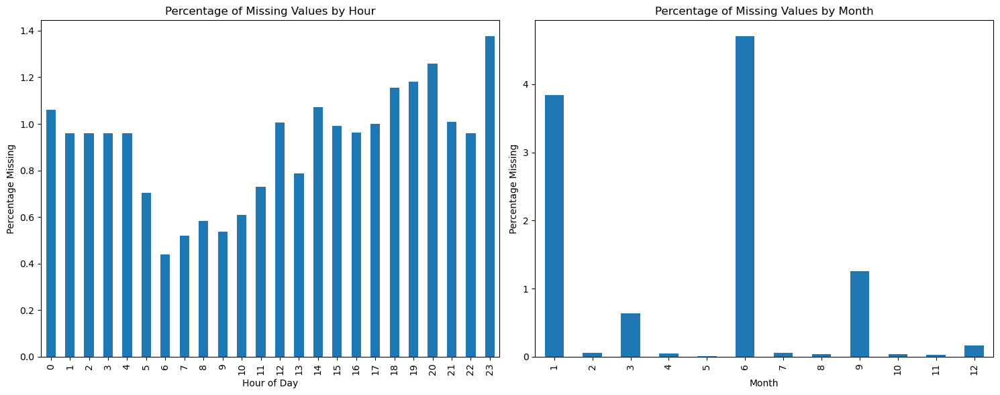

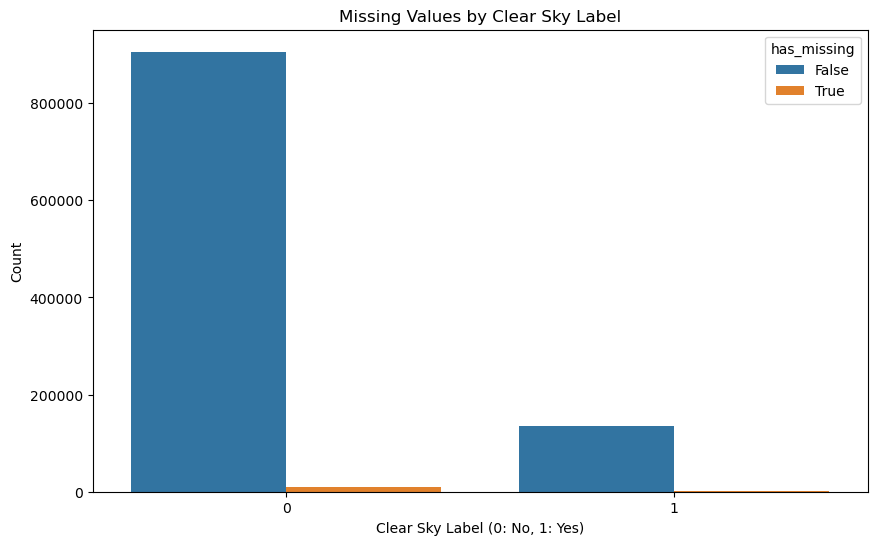


Basic statistics (non-missing values):
                         measured_on  direct_normal  ...          hour         month
count                        1050293   1.040764e+06  ...  1.050293e+06  1.050293e+06
mean   2014-12-31 17:34:27.950827520   2.099889e+02  ...  1.149534e+01  6.521958e+00
min              2014-01-01 00:00:00  -3.070640e+01  ...  0.000000e+00  1.000000e+00
25%              2014-07-02 09:30:00  -3.504000e-01  ...  5.000000e+00  4.000000e+00
50%              2014-12-31 17:43:00   3.344000e-01  ...  1.100000e+01  7.000000e+00
75%              2015-07-02 01:57:00   3.417249e+02  ...  1.700000e+01  1.000000e+01
max              2015-12-31 10:10:00   1.096588e+03  ...  2.300000e+01  1.200000e+01
std                              NaN   3.559091e+02  ...  6.922247e+00  3.445784e+00

[8 rows x 9 columns]

Class distribution:
clearsky_label
0    914797
1    135496
Name: count, dtype: int64
Class imbalance ratio: 1:6.75


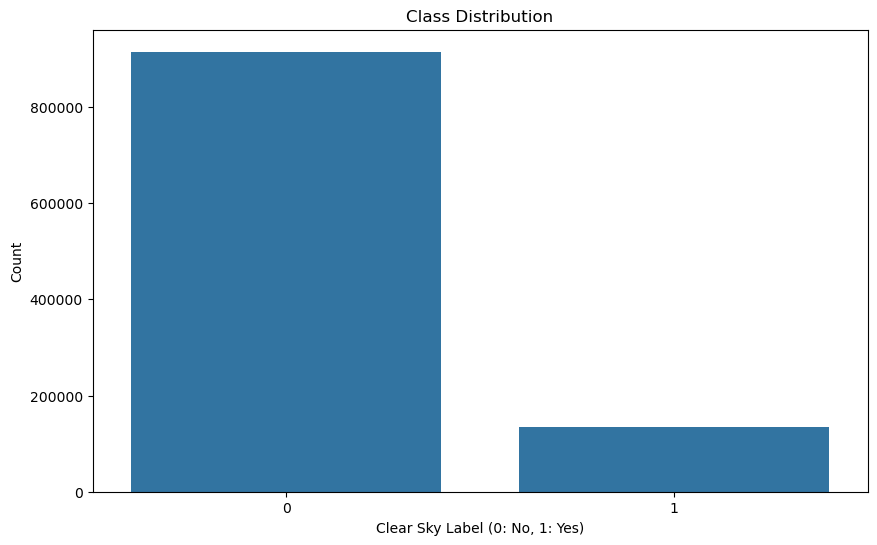


Shape after dropping missing values: (1040764, 10)


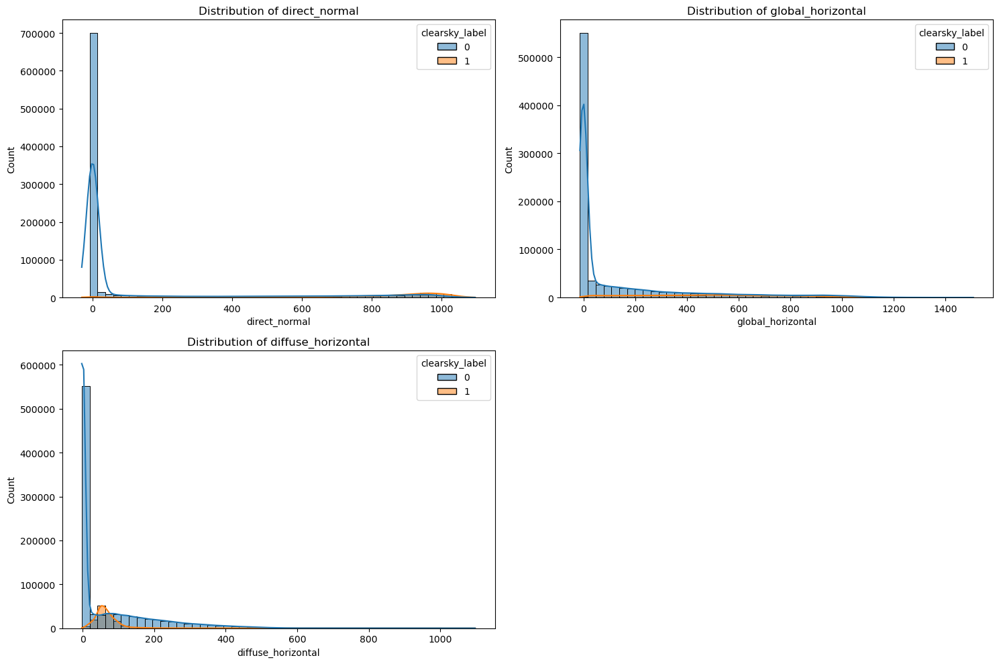

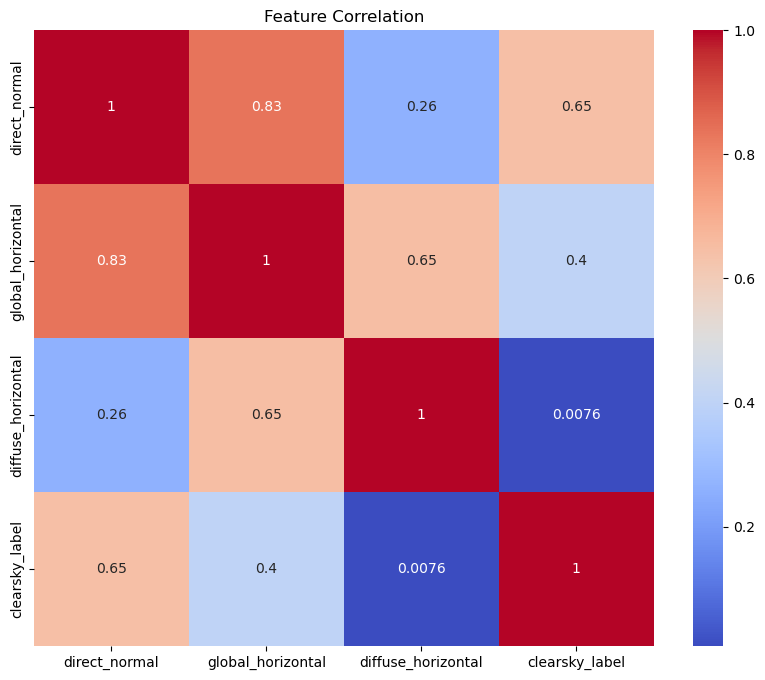

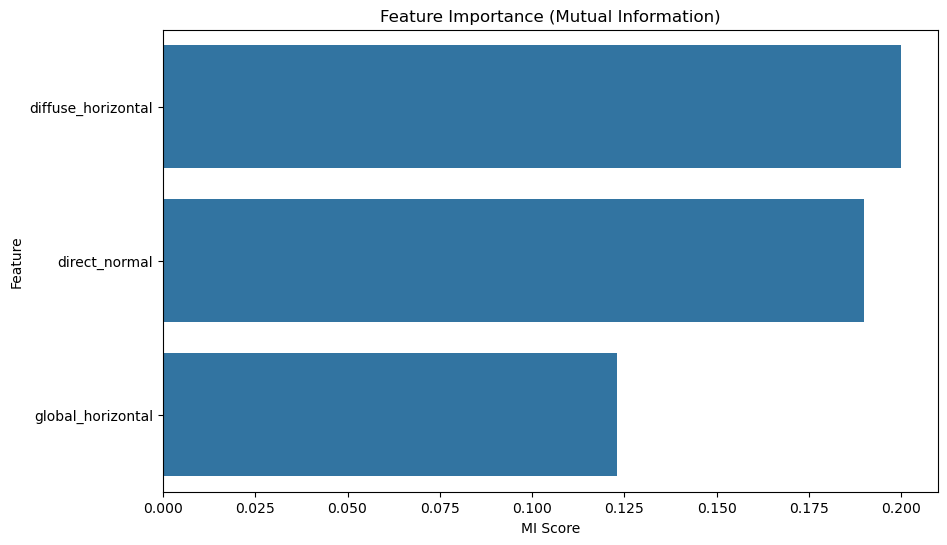

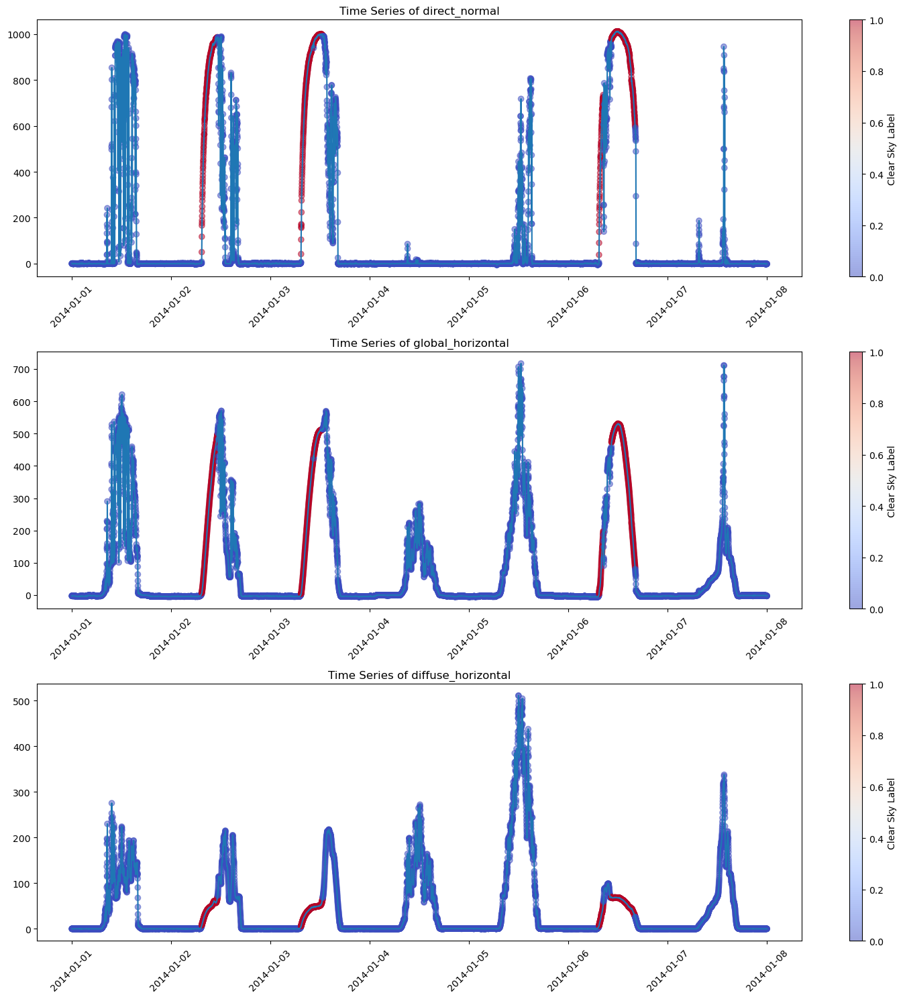

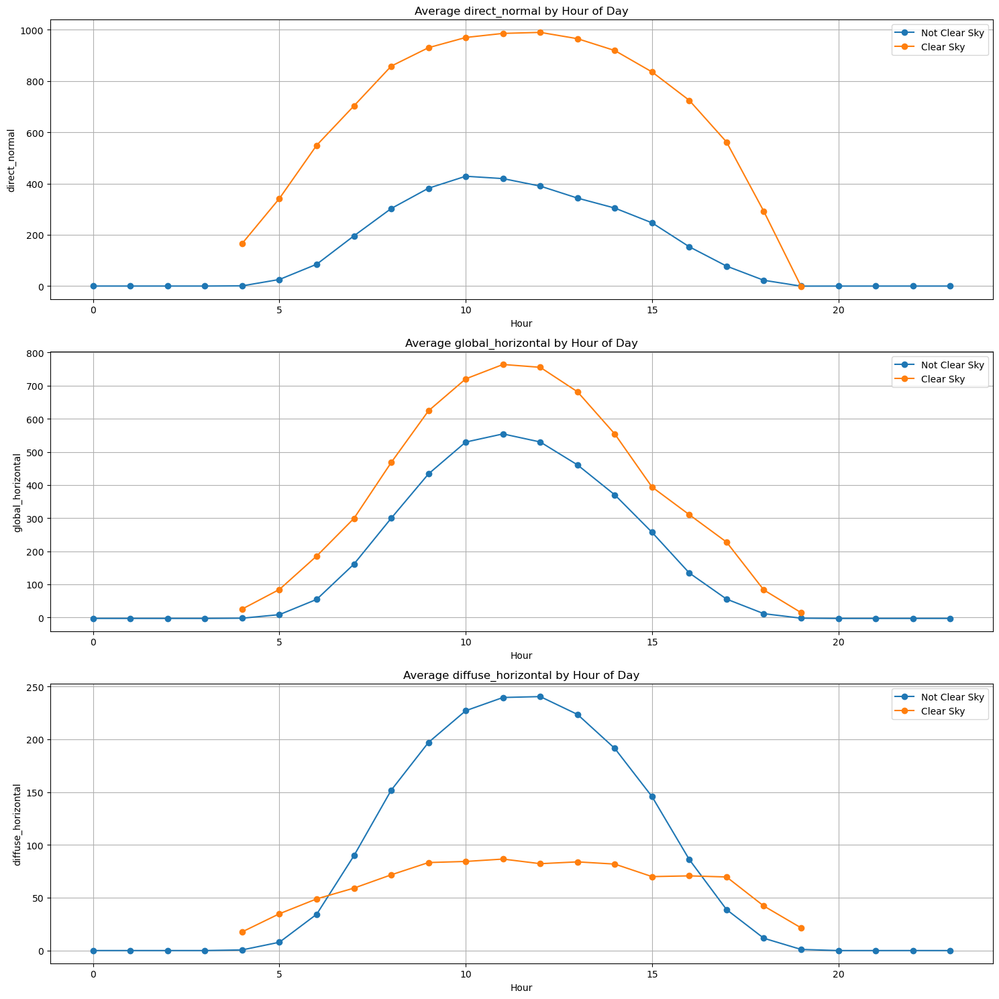

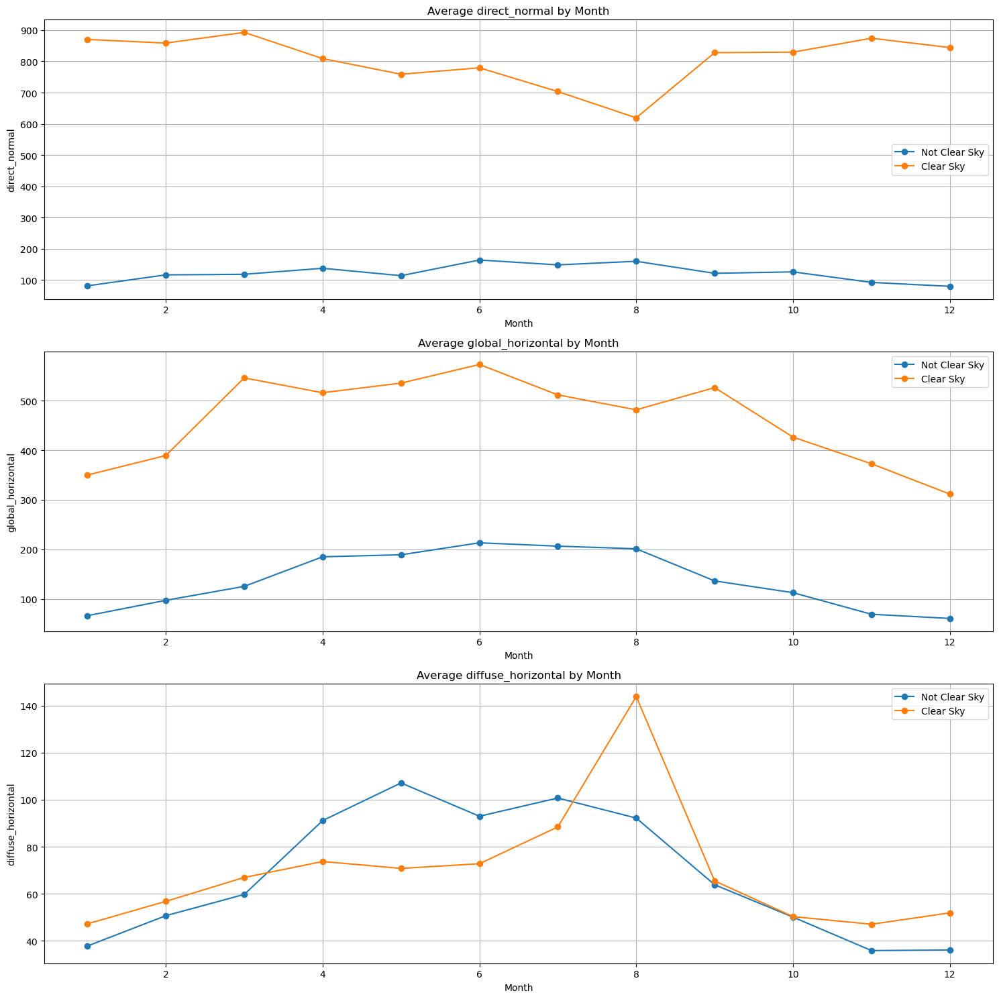

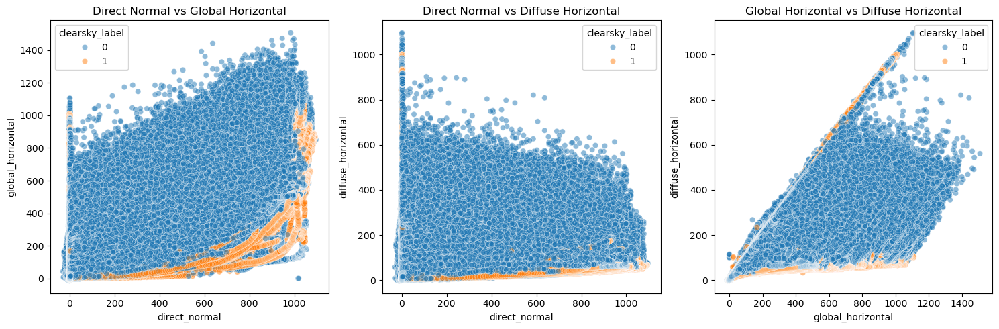

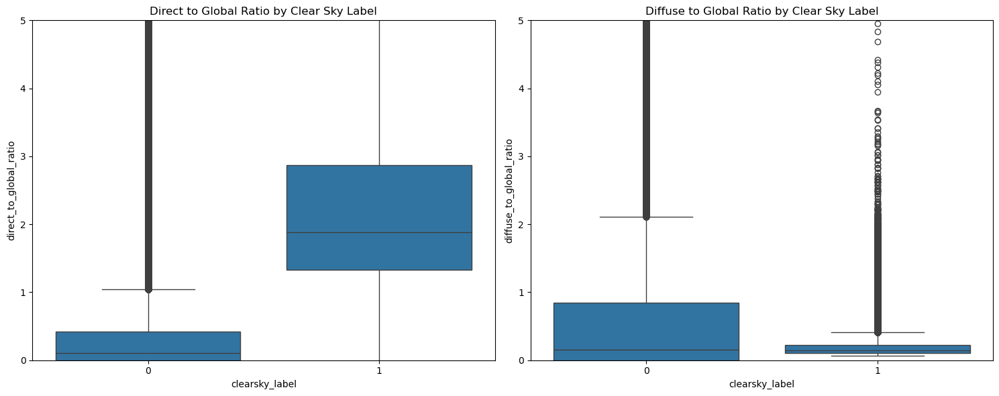

In [3]:
# Load the dataset
df = load_raw_data(raw_file_path, timezone)

# Basic dataset information
print("Dataset shape:", df.shape)
print("\nData types:")
print(df.dtypes)
print("\nMissing values:")
print(df.isnull().sum())
print("\nPercentage of missing values:")
print(df.isnull().sum() / len(df) * 100)

# Analyze when missing values occur
df['has_missing'] = df[['direct_normal', 'global_horizontal', 'diffuse_horizontal']].isnull().any(axis=1)
df['hour'] = df['measured_on'].dt.hour
df['month'] = df['measured_on'].dt.month

# Visualize missing values by hour and month
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
missing_by_hour = df.groupby('hour')['has_missing'].mean() * 100
missing_by_hour.plot(kind='bar')
plt.title('Percentage of Missing Values by Hour')
plt.ylabel('Percentage Missing')
plt.xlabel('Hour of Day')

plt.subplot(1, 2, 2)
missing_by_month = df.groupby('month')['has_missing'].mean() * 100
missing_by_month.plot(kind='bar')
plt.title('Percentage of Missing Values by Month')
plt.ylabel('Percentage Missing')
plt.xlabel('Month')
plt.tight_layout()
plt.show()

# Check if missing values are related to the target variable
plt.figure(figsize=(10, 6))
sns.countplot(x='clearsky_label', hue='has_missing', data=df)
plt.title('Missing Values by Clear Sky Label')
plt.xlabel('Clear Sky Label (0: No, 1: Yes)')
plt.ylabel('Count')
plt.show()

# Basic statistics for non-missing values
print("\nBasic statistics (non-missing values):")
print(df.describe())

# Target variable analysis
print("\nClass distribution:")
class_counts = df['clearsky_label'].value_counts()
print(class_counts)
print(f"Class imbalance ratio: 1:{class_counts[0]/class_counts[1]:.2f}")

# Visualize class distribution
plt.figure(figsize=(10, 6))
sns.countplot(x='clearsky_label', data=df)
plt.title('Class Distribution')
plt.xlabel('Clear Sky Label (0: No, 1: Yes)')
plt.ylabel('Count')
plt.show()

# Drop missing values for feature analysis
df_clean = df.dropna(subset=['direct_normal', 'global_horizontal', 'diffuse_horizontal'])
print(f"\nShape after dropping missing values: {df_clean.shape}")

# Feature distributions (for non-missing values)
features = ['direct_normal', 'global_horizontal', 'diffuse_horizontal']
plt.figure(figsize=(15, 10))
for i, feature in enumerate(features, 1):
    plt.subplot(2, 2, i)
    sns.histplot(data=df_clean, x=feature, hue='clearsky_label', bins=50, kde=True)
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

# Correlation analysis
plt.figure(figsize=(10, 8))
correlation = df_clean[features + ['clearsky_label']].corr()
sns.heatmap(correlation, annot=True, cmap='coolwarm')
plt.title('Feature Correlation')
plt.show()

# Feature importance using mutual information (only on clean data)
X = df_clean[features]
y = df_clean['clearsky_label']
mi_scores = mutual_info_classif(X, y)
mi_df = pd.DataFrame({'Feature': features, 'MI Score': mi_scores})
mi_df = mi_df.sort_values('MI Score', ascending=False)

plt.figure(figsize=(10, 6))
sns.barplot(x='MI Score', y='Feature', data=mi_df)
plt.title('Feature Importance (Mutual Information)')
plt.show()

# Temporal analysis - sample a week of data with no missing values
# Find a continuous week with minimal missing values
df_clean['date'] = df_clean['measured_on'].dt.date
dates_count = df_clean['date'].value_counts().sort_index()
dates_with_full_data = dates_count[dates_count >= 1440]  # 1440 minutes in a day

if len(dates_with_full_data) >= 7:
    start_date = dates_with_full_data.index[0]
    end_date = start_date + pd.Timedelta(days=6)
    sample_week = df_clean[(df_clean['measured_on'].dt.date >= start_date) & 
                           (df_clean['measured_on'].dt.date <= end_date)]
    
    plt.figure(figsize=(15, 15))
    for i, feature in enumerate(features, 1):
        plt.subplot(3, 1, i)
        plt.plot(sample_week['measured_on'], sample_week[feature])
        plt.scatter(sample_week['measured_on'], sample_week[feature], 
                    c=sample_week['clearsky_label'], cmap='coolwarm', alpha=0.5)
        plt.title(f'Time Series of {feature}')
        plt.colorbar(label='Clear Sky Label')
        plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

# Daily patterns
hourly_avg = df_clean.groupby(['hour', 'clearsky_label'])[features].mean().reset_index()

plt.figure(figsize=(15, 15))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 1, i)
    for label in [0, 1]:
        subset = hourly_avg[hourly_avg['clearsky_label'] == label]
        plt.plot(subset['hour'], subset[feature], 
                 label=f'Label {label}', marker='o')
    plt.title(f'Average {feature} by Hour of Day')
    plt.xlabel('Hour')
    plt.ylabel(feature)
    plt.legend(['Not Clear Sky', 'Clear Sky'])
    plt.grid(True)
plt.tight_layout()
plt.show()

# Monthly patterns
monthly_avg = df_clean.groupby(['month', 'clearsky_label'])[features].mean().reset_index()

plt.figure(figsize=(15, 15))
for i, feature in enumerate(features, 1):
    plt.subplot(3, 1, i)
    for label in [0, 1]:
        subset = monthly_avg[monthly_avg['clearsky_label'] == label]
        plt.plot(subset['month'], subset[feature], 
                 label=f'Label {label}', marker='o')
    plt.title(f'Average {feature} by Month')
    plt.xlabel('Month')
    plt.ylabel(feature)
    plt.legend(['Not Clear Sky', 'Clear Sky'])
    plt.grid(True)
plt.tight_layout()
plt.show()

# Analyze the relationship between features
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
sns.scatterplot(data=df_clean, x='direct_normal', y='global_horizontal', hue='clearsky_label', alpha=0.5)
plt.title('Direct Normal vs Global Horizontal')

plt.subplot(1, 3, 2)
sns.scatterplot(data=df_clean, x='direct_normal', y='diffuse_horizontal', hue='clearsky_label', alpha=0.5)
plt.title('Direct Normal vs Diffuse Horizontal')

plt.subplot(1, 3, 3)
sns.scatterplot(data=df_clean, x='global_horizontal', y='diffuse_horizontal', hue='clearsky_label', alpha=0.5)
plt.title('Global Horizontal vs Diffuse Horizontal')
plt.tight_layout()
plt.show()

# Calculate feature ratios that might be useful
df_clean['direct_to_global_ratio'] = df_clean['direct_normal'] / df_clean['global_horizontal'].replace(0, np.nan)
df_clean['diffuse_to_global_ratio'] = df_clean['diffuse_horizontal'] / df_clean['global_horizontal'].replace(0, np.nan)

# Visualize these ratios
plt.figure(figsize=(15, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x='clearsky_label', y='direct_to_global_ratio', data=df_clean.dropna(subset=['direct_to_global_ratio']))
plt.title('Direct to Global Ratio by Clear Sky Label')
plt.ylim(0, 5)  # Adjust as needed

plt.subplot(1, 2, 2)
sns.boxplot(x='clearsky_label', y='diffuse_to_global_ratio', data=df_clean.dropna(subset=['diffuse_to_global_ratio']))
plt.title('Diffuse to Global Ratio by Clear Sky Label')
plt.ylim(0, 5)  # Adjust as needed
plt.tight_layout()
plt.show()

Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
0:	learn: 0.9418484	test: 0.9320927	best: 0.9320927 (0)	total: 652ms	remaining: 10m 51s
100:	learn: 0.9619094	test: 0.9483908	best: 0.9483908 (100)	total: 1m 6s	remaining: 9m 53s
200:	learn: 0.9669312	test: 0.9533245	best: 0.9533245 (200)	total: 2m 7s	remaining: 8m 27s
300:	learn: 0.9693787	test: 0.9564248	best: 0.9564248 (300)	total: 2m 56s	remaining: 6m 49s
400:	learn: 0.9712694	test: 0.9603165	best: 

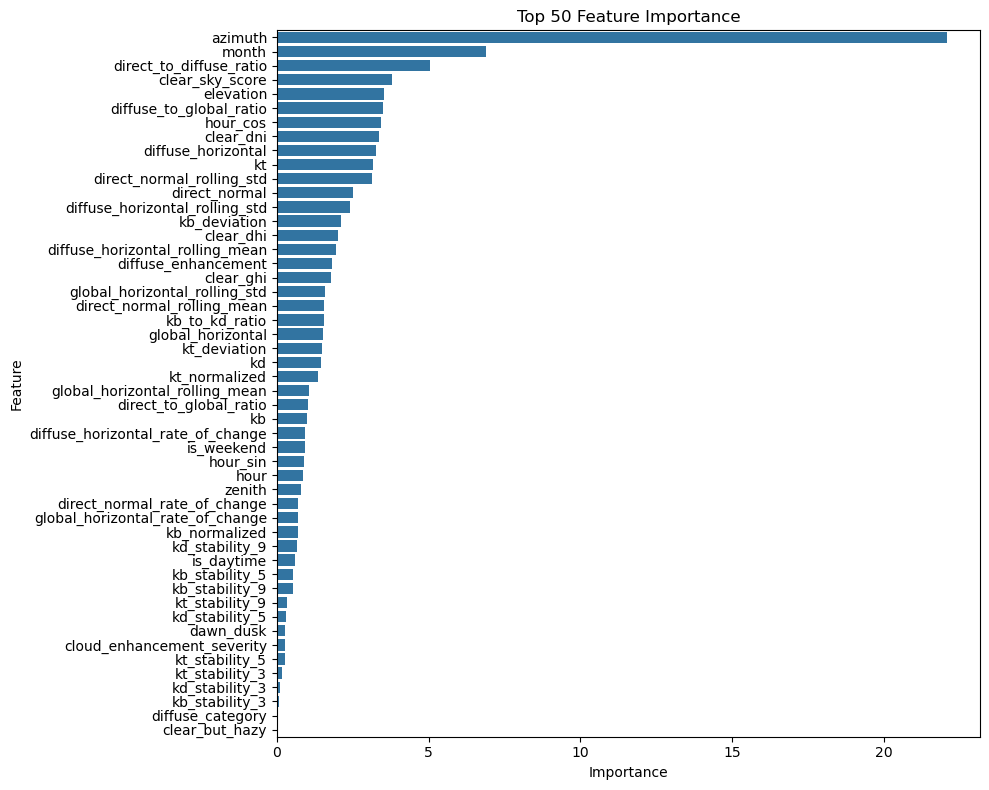

Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians


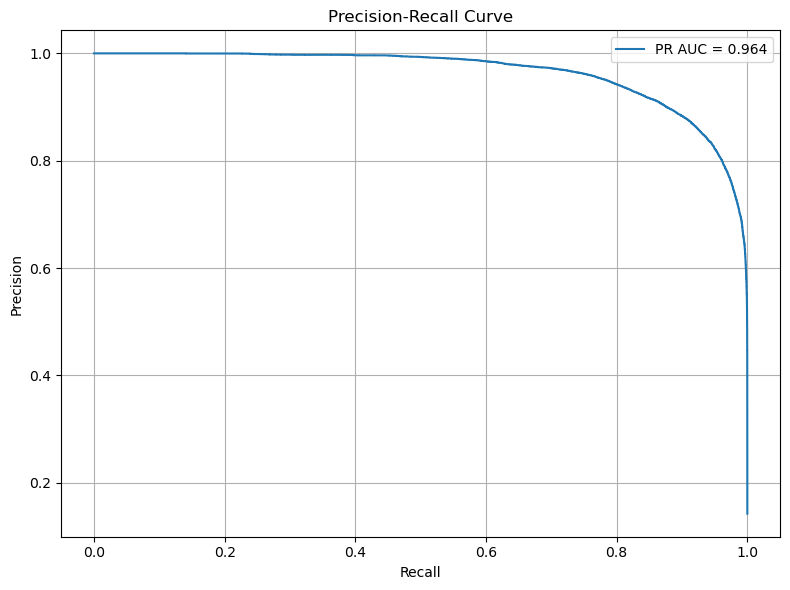


Analyzing model performance and errors...
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians


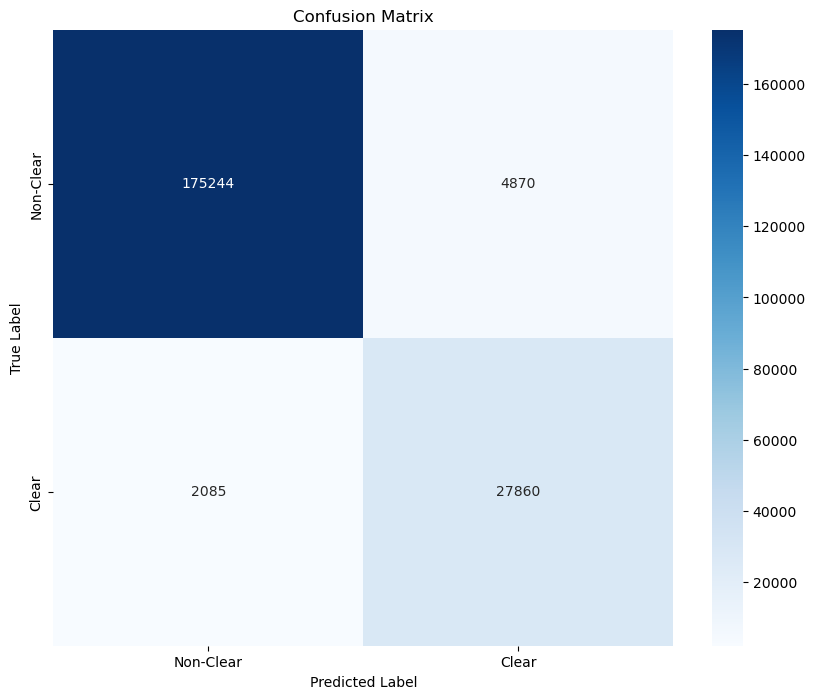

Total samples: 210059
True Negatives: 175244 (83.43%)
False Positives: 4870 (2.32%)
False Negatives: 2085 (0.99%)
True Positives: 27860 (13.26%)

Metrics:
Accuracy: 0.9669
Precision: 0.8512
Recall: 0.9304
Specificity: 0.9730
False Positive Rate: 0.0270
False Negative Rate: 0.0696


In [2]:
from pvc.clear_sky_classifier import ClearSkyClassifier, fix_clear_sky_nans_with_nearby_zenith_medians
model = ClearSkyClassifier(
    model_params={
        'iterations': 1000,
        'learning_rate': 0.05,  
        'depth': 5, # 6
        'l2_leaf_reg': 3,
        'eval_metric': 'F1',
        'early_stopping_rounds': 150,
        'loss_function': 'Logloss',
        'auto_class_weights': 'Balanced',
        'random_seed': 41,
        'verbose': 100
    },
    
    feature_engineering=True,
    handle_imbalance=True,
    latitude=39.7420,   
    longitude=-105.1778,
    altitude=1829,
    timezone='America/Denver'
)

model, X_test, y_test = train_clear_sky_model(raw_file_path, timezone, model)

# Save the model
# model.save_model("clear_sky_classifier.cbm")


## Missing Values Before SHAP [APPLIED]

In [5]:
def analyze_clear_sky_nans(df, model):
    """
    Analyze NaN values in clear sky calculations using existing processed data.
    
    Args:
        df: DataFrame with time data
        model: ClearSkyClassifier model instance
    """
    
    print("\n=== ANALYZING CLEAR SKY NaN VALUES ===")
    
    # Process the data using the model's existing methods
    print("Processing data with model's methods...")
    processed_df, _ = model._prepare_features(df, is_training=False)
    
    # Find columns related to clear sky calculations
    clear_cols = [col for col in processed_df.columns if col.startswith('clear_')]
    
    if not clear_cols:
        print("No clear sky columns found in the processed data")
        return processed_df
    
    # Check for NaN values in clear sky columns
    nan_counts = {col: processed_df[col].isna().sum() for col in clear_cols}
    print("\nNaN counts in clear sky columns:")
    for col, count in nan_counts.items():
        print(f"  {col}: {count} NaNs ({count/len(processed_df)*100:.1f}%)")
    
    # Check if NaNs are related to night time (if zenith is available)
    if 'zenith' in processed_df.columns:
        night_mask = processed_df['zenith'] > 90
        night_count = night_mask.sum()
        print(f"\nNight time points (zenith > 90°): {night_count} ({night_count/len(processed_df)*100:.1f}%)")
        
        for col in clear_cols:
            nan_mask = processed_df[col].isna()
            if nan_mask.sum() > 0:
                night_nans = (nan_mask & night_mask).sum()
                day_nans = (nan_mask & ~night_mask).sum()
                
                print(f"\nNaN analysis for {col}:")
                print(f"  Total NaNs: {nan_mask.sum()}")
                print(f"  NaNs during night: {night_nans} ({night_nans/nan_mask.sum()*100:.1f}%)")
                print(f"  NaNs during day: {day_nans} ({day_nans/nan_mask.sum()*100:.1f}%)")
                
                # Plot histogram of zenith angles for NaN values
                plt.figure(figsize=(10, 6))
                plt.hist(
                    processed_df.loc[nan_mask, 'zenith'], 
                    bins=30, 
                    alpha=0.7,
                    label=f'{col} NaNs'
                )
                plt.xlabel('Solar Zenith Angle (degrees)')
                plt.ylabel('Count of NaN Values')
                plt.title(f'Distribution of NaN Values in {col} by Solar Zenith Angle')
                plt.grid(alpha=0.3)
                plt.axvline(x=90, color='red', linestyle='--', alpha=0.7, label='Horizon (90°)')
                plt.legend()
                plt.tight_layout()
                plt.show()
    
    # Check if NaNs are related to specific times of day
    if 'measured_on' in processed_df.columns:
        for col in clear_cols:
            nan_mask = processed_df[col].isna()
            if nan_mask.sum() > 0:
                # Plot NaNs by hour of day
                if hasattr(processed_df['measured_on'], 'dt'):
                    # Create a new column for hour to avoid groupby issues with duplicate timestamps
                    processed_df['hour_of_day'] = processed_df['measured_on'].dt.hour
                    
                    # Count NaNs by hour without using groupby
                    hour_counts = {}
                    for hour in range(24):
                        hour_mask = processed_df['hour_of_day'] == hour
                        hour_counts[hour] = (nan_mask & hour_mask).sum()
                    
                    # Convert to Series for plotting
                    hour_series = pd.Series(hour_counts)
                    
                    plt.figure(figsize=(10, 6))
                    plt.bar(hour_series.index, hour_series.values, alpha=0.7)
                    plt.xlabel('Hour of Day')
                    plt.ylabel('Number of NaN Values')
                    plt.title(f'NaN Values in {col} by Hour of Day')
                    plt.xticks(range(0, 24))
                    plt.grid(axis='y', alpha=0.3)
                    plt.tight_layout()
                    plt.show()
    
    return processed_df

In [6]:
from pvc.clear_sky_classifier import ClearSkyClassifier

model_ = ClearSkyClassifier(
    model_params={
        'iterations': 500,
        'learning_rate': 0.05,  
        'depth': 5, # 6
        'l2_leaf_reg': 3,
        'eval_metric': 'F1',
        'early_stopping_rounds': 150,
        'loss_function': 'Logloss',
        'auto_class_weights': 'Balanced',
        'random_seed': 41,
        'verbose': 100
    },
    
    feature_engineering=True,
    handle_imbalance=True,
    latitude=39.7420,   
    longitude=-105.1778,
    altitude=1829,
    timezone='America/Denver'
)

# Load data
# df_ = load_raw_data(raw_file_path, timezone)
# df_.dropna(inplace=True)
# _ = analyze_clear_sky_nans(df_, model_)

In [7]:
# processed_df_, _ = model_._prepare_features(df_, is_training=False)
# fixed_df = fix_clear_sky_nans_with_nearby_zenith_medians(processed_df_)
# print(fixed_df.isna().sum())

In [8]:
# if (fixed_df.isna().sum() > 0).any():
#     print("There are still NaNs in the DataFrame")
# else:
#     print("All NaNs have been successfully filled")


# SHAP analysis

Overall feature importance based on SHAP values:
Computing SHAP values for 1000 samples
Input data shape: (1000, 6)
Input data columns: ['measured_on', 'direct_normal', 'global_normal', 'global_horizontal', 'diffuse_horizontal', 'poa_irradiance']
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians

=== MODEL'S INTERNAL FEATURE INFORMATION ===
CatBoost model feature names:
Model's feature_names_: ['direct_normal', 'global_horizontal', 'diffuse_horizontal', 'hour', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month', 'is_weekend', 'direct_to_global_ratio', 'diffuse_to_global_ratio', 'direct_to_diffuse_ratio', 'is_daytime', 'direct_normal_rolling_mean', 'direct_normal_rolling_std', 'direct_normal_rate_of_change', 'global_horizontal_rolling_mean',

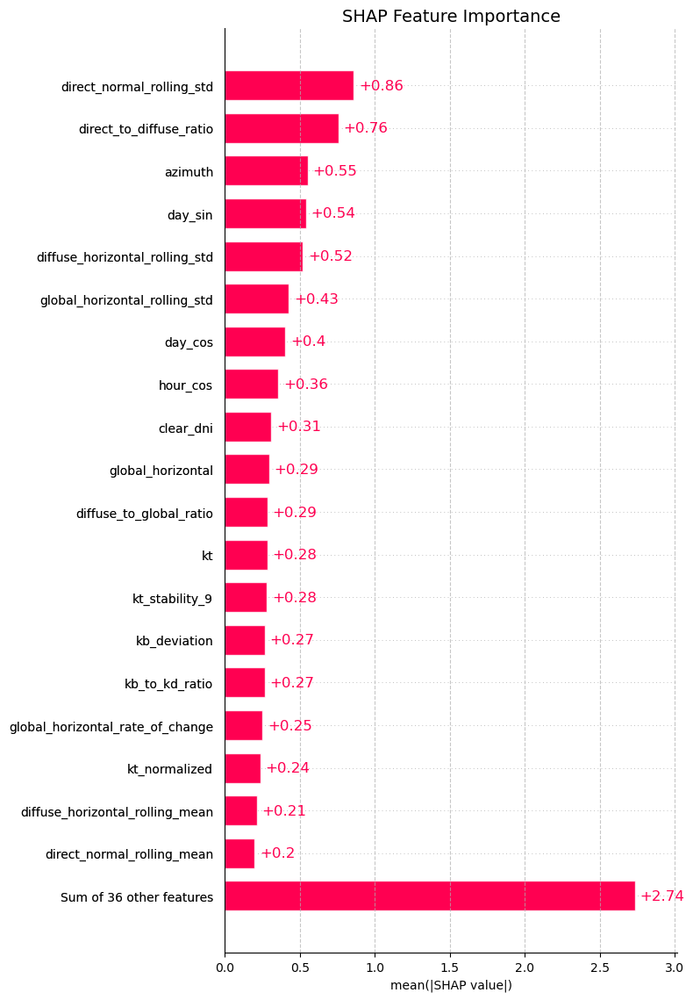

Computing SHAP values for 100 samples
Input data shape: (100, 6)
Input data columns: ['measured_on', 'direct_normal', 'global_normal', 'global_horizontal', 'diffuse_horizontal', 'poa_irradiance']
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi

=== MODEL'S INTERNAL FEATURE INFORMATION ===
CatBoost model feature names:
Model's feature_names_: ['direct_normal', 'global_horizontal', 'diffuse_horizontal', 'hour', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month', 'is_weekend', 'direct_to_global_ratio', 'diffuse_to_global_ratio', 'direct_to_diffuse_ratio', 'is_daytime', 'direct_normal_rolling_mean', 'direct_normal_rolling_std', 'direct_normal_rate_of_change', 'global_horizontal_rolling_mean', 'global_horizontal_rolling_std', 'global_horizontal_rate_of_change', 'diffuse_horizontal_rolling_mean', 'diffuse_horizontal_rolling_std', 'diffuse_horizontal_rate_of_change', 'kt', 'kb', 'kd', 'clear_ghi', 'clear_dni', 'clear_dhi', 'zenith', 'azimuth', 'elevation', 

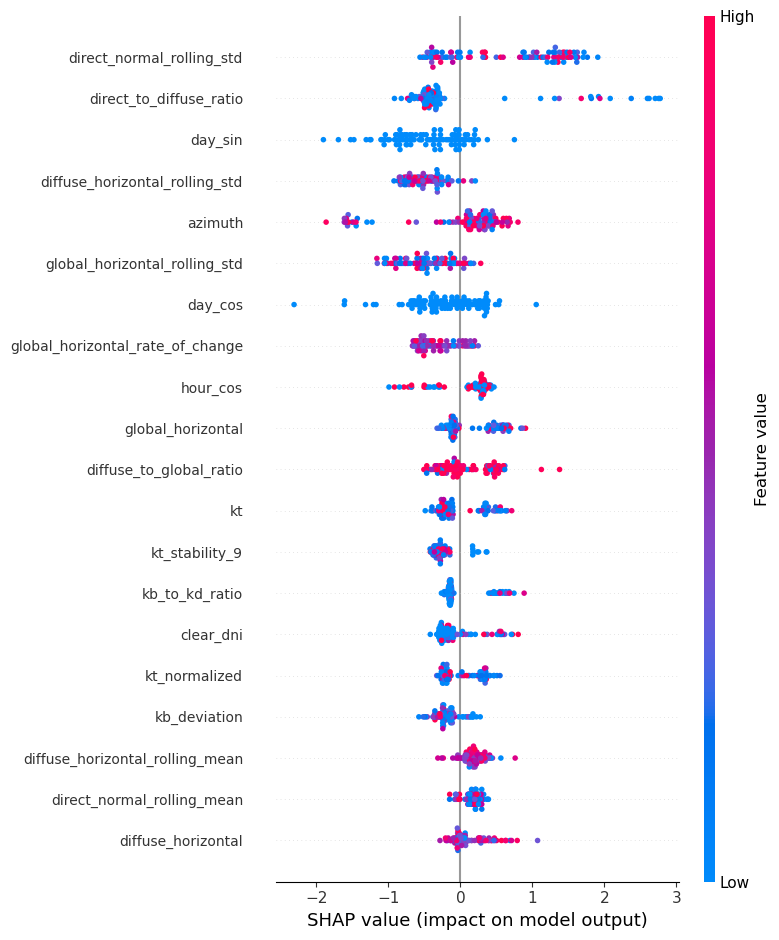

Computing SHAP values for 1 samples
Input data shape: (1, 6)
Input data columns: ['measured_on', 'direct_normal', 'global_normal', 'global_horizontal', 'diffuse_horizontal', 'poa_irradiance']
Found 1 NaNs in clear_ghi
Found 1 NaNs in clear_dni
Found 1 NaNs in clear_dhi

=== MODEL'S INTERNAL FEATURE INFORMATION ===
CatBoost model feature names:
Model's feature_names_: ['direct_normal', 'global_horizontal', 'diffuse_horizontal', 'hour', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month', 'is_weekend', 'direct_to_global_ratio', 'diffuse_to_global_ratio', 'direct_to_diffuse_ratio', 'is_daytime', 'direct_normal_rolling_mean', 'direct_normal_rolling_std', 'direct_normal_rate_of_change', 'global_horizontal_rolling_mean', 'global_horizontal_rolling_std', 'global_horizontal_rate_of_change', 'diffuse_horizontal_rolling_mean', 'diffuse_horizontal_rolling_std', 'diffuse_horizontal_rate_of_change', 'kt', 'kb', 'kd', 'clear_ghi', 'clear_dni', 'clear_dhi', 'zenith', 'azimuth', 'elevation', 'kt_sta

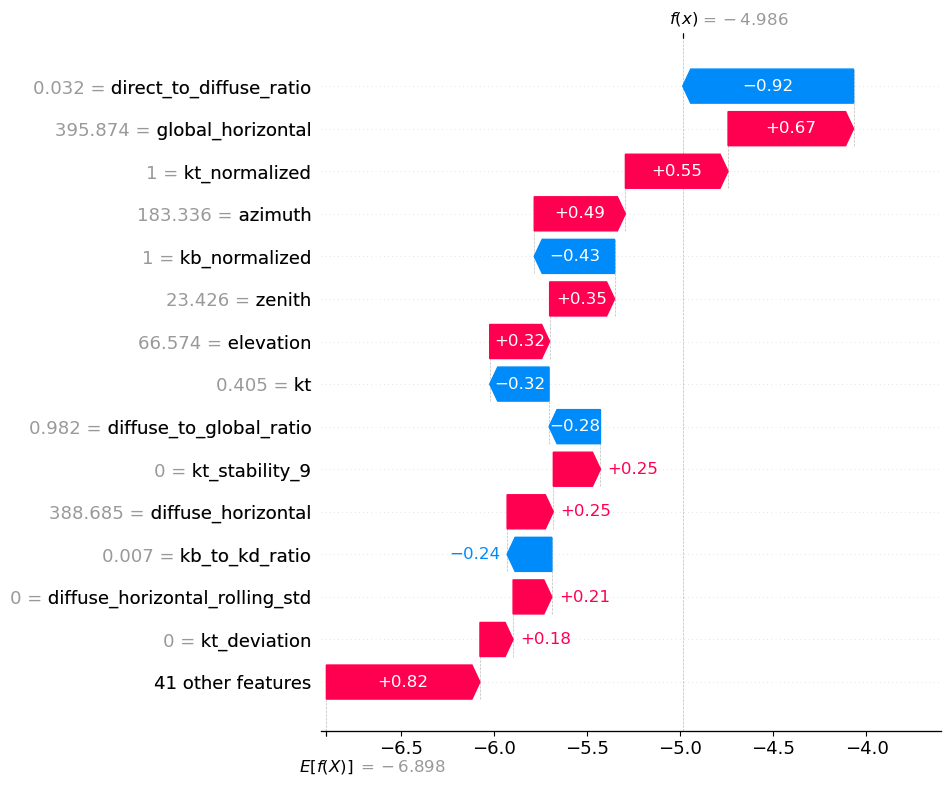

In [34]:
from pvc.clear_sky_shap_explainer_v3r57 import ClearSkyShapExplainer
shap_explainer = ClearSkyShapExplainer(model)

# Plot feature importance
print("Overall feature importance based on SHAP values:")
shap_explainer.plot_feature_importance(X_test, sample_size=1000)

shap_explainer.plot_summary(X_test)

# shap_explainer.plot_force(X_test, y_test, sample_idx=0)

shap_explainer.plot_waterfall(X_test)



## Force Plot vs Decision Plot

Using temporary directory: /var/folders/zk/83r7bdpd2g11psvjbywlbxsr0000gn/T/tmp4vrp4t0h
Computing SHAP values for 210059 samples
Input data shape: (210059, 6)
Input data columns: ['measured_on', 'direct_normal', 'global_normal', 'global_horizontal', 'diffuse_horizontal', 'poa_irradiance']
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians

=== MODEL'S INTERNAL FEATURE INFORMATION ===
CatBoost model feature names:
Model's feature_names_: ['direct_normal', 'global_horizontal', 'diffuse_horizontal', 'hour', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month', 'is_weekend', 'direct_to_global_ratio', 'diffuse_to_global_ratio', 'direct_to_diffuse_ratio', 'is_daytime', 'direct_normal_rolling_mean', 'direct_normal_rolling_std', 'direct_normal_rate_of

<Figure size 2000x300 with 0 Axes>

<Figure size 2000x300 with 0 Axes>

<Figure size 2000x300 with 0 Axes>

<Figure size 2000x300 with 0 Axes>

<Figure size 2000x300 with 0 Axes>

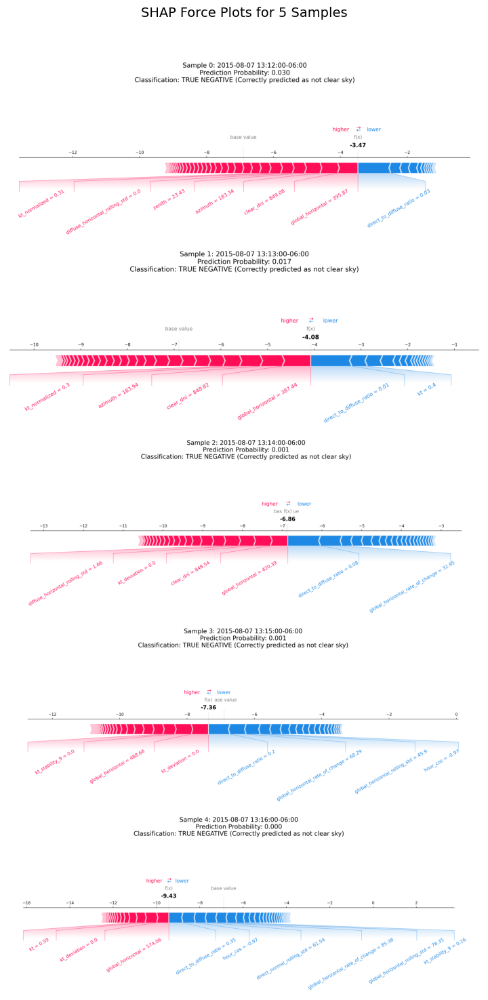

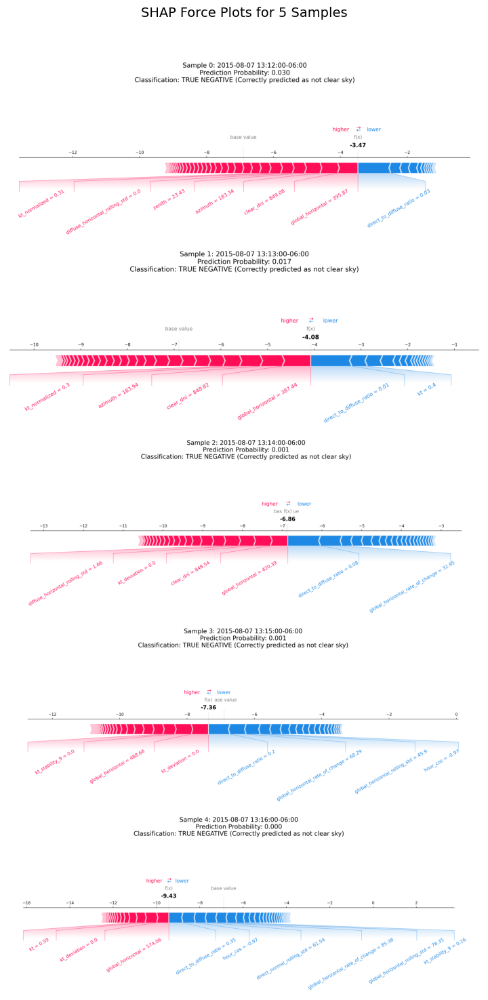

In [43]:
shap_explainer.plot_multiple_forces_v1(X_test, y=y_test,
                                    sample_indices=[0, 1, 2, 3, 4])

Found 10 NaNs in clear_ghi
Found 10 NaNs in clear_dni
Found 10 NaNs in clear_dhi
Computing SHAP values for 10 samples
Input data shape: (10, 6)
Input data columns: ['measured_on', 'direct_normal', 'global_normal', 'global_horizontal', 'diffuse_horizontal', 'poa_irradiance']
Found 10 NaNs in clear_ghi
Found 10 NaNs in clear_dni
Found 10 NaNs in clear_dhi

=== MODEL'S INTERNAL FEATURE INFORMATION ===
CatBoost model feature names:
Model's feature_names_: ['direct_normal', 'global_horizontal', 'diffuse_horizontal', 'hour', 'hour_sin', 'hour_cos', 'day_sin', 'day_cos', 'month', 'is_weekend', 'direct_to_global_ratio', 'diffuse_to_global_ratio', 'direct_to_diffuse_ratio', 'is_daytime', 'direct_normal_rolling_mean', 'direct_normal_rolling_std', 'direct_normal_rate_of_change', 'global_horizontal_rolling_mean', 'global_horizontal_rolling_std', 'global_horizontal_rate_of_change', 'diffuse_horizontal_rolling_mean', 'diffuse_horizontal_rolling_std', 'diffuse_horizontal_rate_of_change', 'kt', 'kb', 

<Figure size 640x480 with 0 Axes>

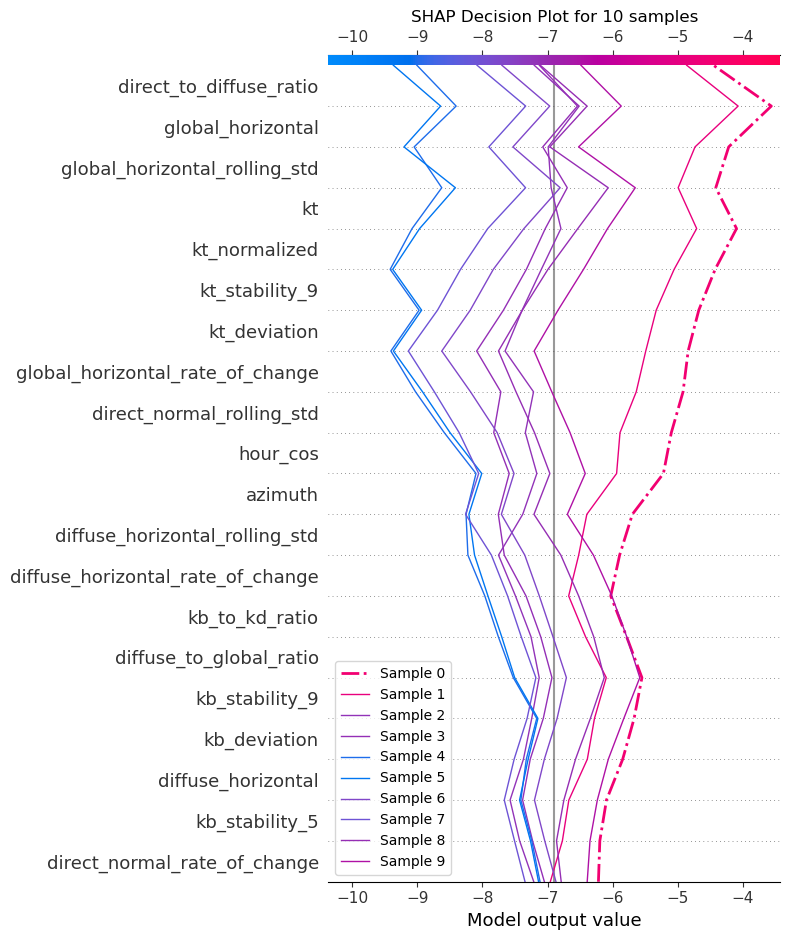

In [45]:
# shap_explainer.plot_multiple_forces(X_test, y=y_test,
#                                     sample_indices=[0, 1, 2, 3, 4])

shap_explainer.plot_decision(X_test, 
                             sample_indices=[0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

## False cases


Analyzing misclassifications with SHAP:
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
Found 4870 false positives and 2085 false negatives
False positive probabilities range: 0.500 - 0.997

===== FALSE POSITIVES ANALYSIS =====
Cases where the model predicted clear sky (1) but actual label was not clear (0)
Computing SHAP values for 4870 samples
Input data shape: (4870, 6)
Input data columns: ['measured_on', 'direct_normal', 'global_normal', 'global_horizontal', 'diffuse_horizontal', 'poa_irradiance']
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully fille

<Figure size 2000x300 with 0 Axes>

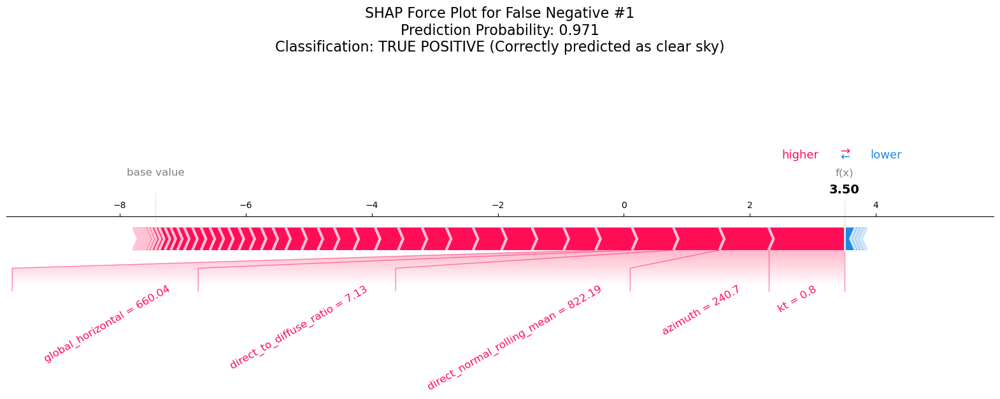

<Figure size 2000x300 with 0 Axes>

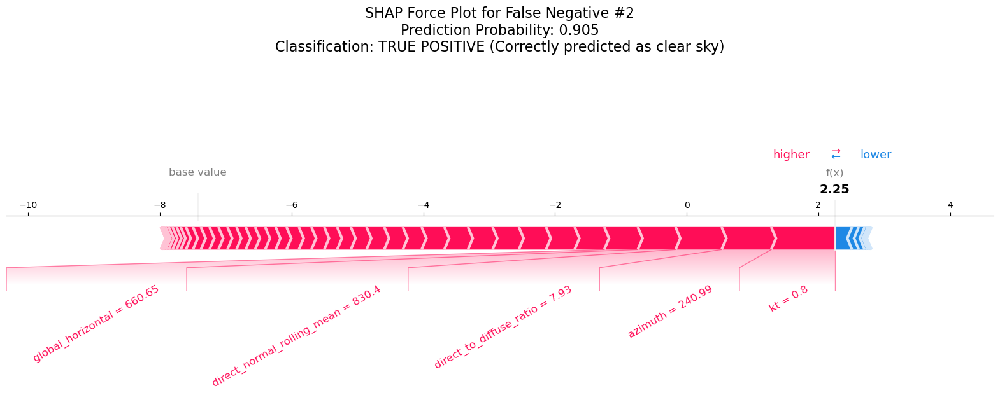

<Figure size 2000x300 with 0 Axes>

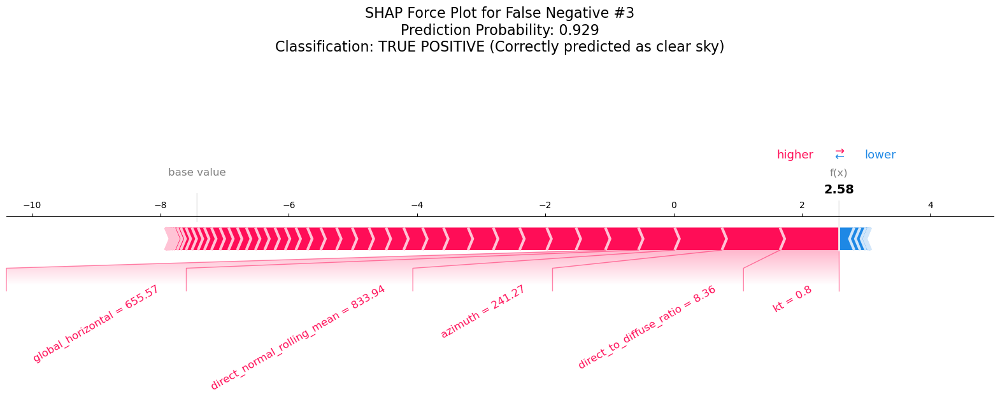

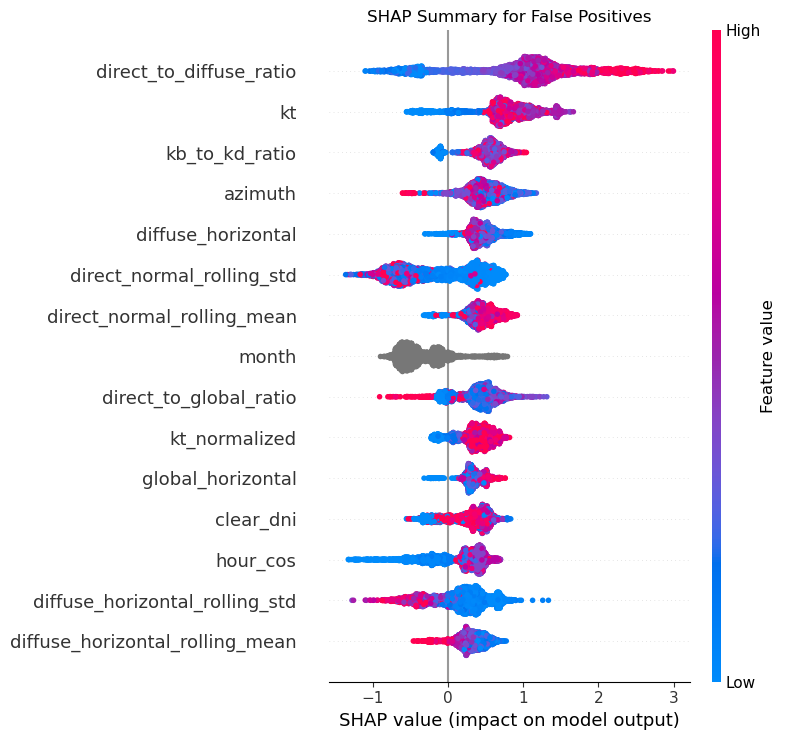


False Positive Example #1 (Index: 166)
Key feature values:
  direct_normal: 787.3874
  global_horizontal: 538.9460
  diffuse_horizontal: 95.5387

False Positive Example #2 (Index: 309)
Key feature values:
  direct_normal: 95.2740
  global_horizontal: 25.0233
  diffuse_horizontal: 16.9433

False Positive Example #3 (Index: 314)
Key feature values:
  direct_normal: 141.8948
  global_horizontal: 27.1466
  diffuse_horizontal: 13.2633

===== FALSE NEGATIVES ANALYSIS =====
Cases where the model predicted not clear sky (0) but actual label was clear (1)
Computing SHAP values for 2085 samples
Input data shape: (2085, 6)
Input data columns: ['measured_on', 'direct_normal', 'global_normal', 'global_horizontal', 'diffuse_horizontal', 'poa_irradiance']
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all

<Figure size 2000x300 with 0 Axes>

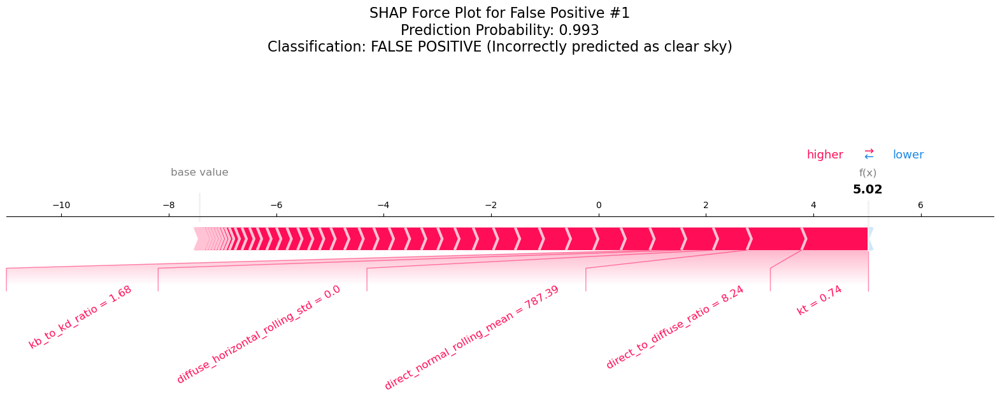

<Figure size 2000x300 with 0 Axes>

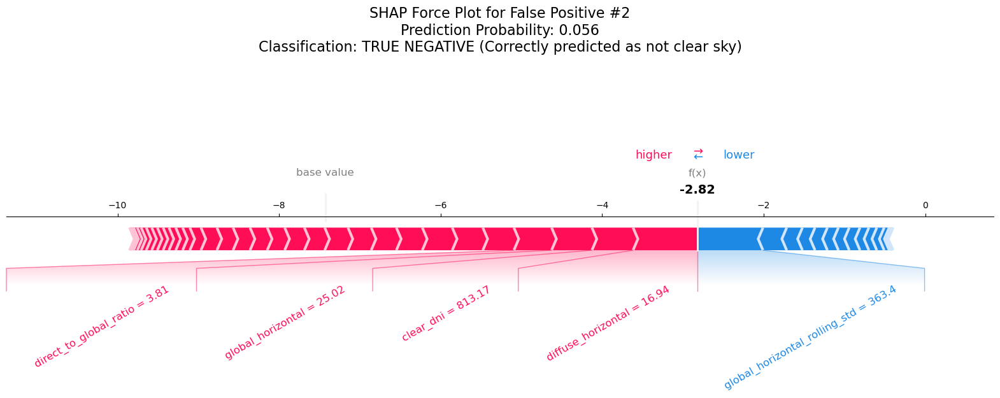

<Figure size 2000x300 with 0 Axes>

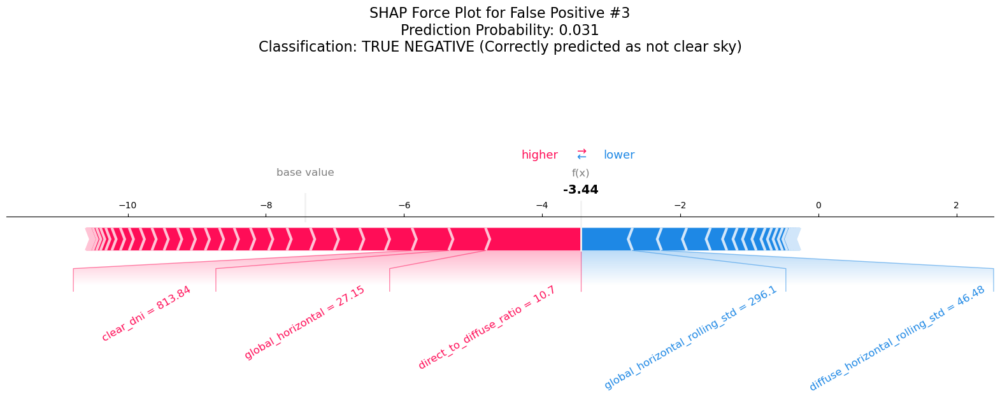

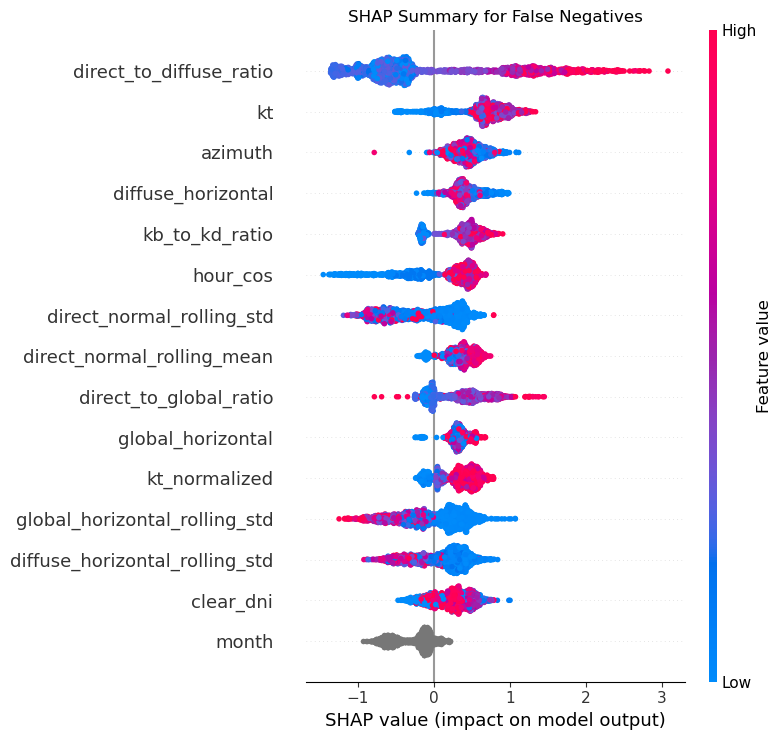


False Negative Example #1 (Index: 128)
Key feature values:
  direct_normal: 822.1894
  global_horizontal: 660.0381
  diffuse_horizontal: 115.3334

False Negative Example #2 (Index: 129)
Key feature values:
  direct_normal: 838.6021
  global_horizontal: 660.6542
  diffuse_horizontal: 105.7861

False Negative Example #3 (Index: 130)
Key feature values:
  direct_normal: 841.0220
  global_horizontal: 655.5726
  diffuse_horizontal: 100.5814


In [8]:
from pvc.clear_sky_shap_explainer_v3r66 import ClearSkyShapExplainer

shap_explainer = ClearSkyShapExplainer(model)

# Analyze misclassifications
print("\nAnalyzing misclassifications with SHAP:")
misclassification_results = shap_explainer.analyze_misclassifications(X_test, y_test, 
                                                                      max_samples=1000,
                                                                      fp_or_fn='both')

# Analyze temporal patterns
# print("\nAnalyzing temporal patterns in misclassifications:")
# temporal_results = shap_explainer.analyze_temporal_patterns(X_test, y_test)


## False Positive: Cloudy instances incorrectly classified as clear sky


<span>
<image src='outputs/round01/overtest_summary.png' width='300'>
<image src='outputs/round01/fp_summary.png' width='300'>
</span>

Insights from comparison:

1. Direct Normal Rolling Standard Deviation
* Overall dataset: Values are distributed more evenly around zero impact
* False positives: Shows a clear bimodal pattern with significant positive impact at both high and low values
2. Direct-to-Diffuse Ratio
* Overall dataset: Primarily clustered near center with mild impact
* False positives: Strongly skewed toward high positive impact, especially at high values (red dots)
3. Azimuth
* Overall dataset: Has a balanced distribution
* False positives: Shows stronger positive impact, particularly at specific angles (red clusters)
4. Diffuse-to-Global Ratio
* Overall dataset: Values have moderate impact spread across the range
* False positives: Shows a concentrated positive impact at specific values
5. KB-to-KD Ratio
* Overall dataset: Modest impact with some positive influence at higher values
* False positives: Much stronger positive push toward clear sky prediction 


AND:

* The SHAP summaries show you what features are causing false positives
* Clustering will tell how many cases fall into each pattern and their relative importance
* This helps me prioritize which issues to fix first

Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians

Debug Information:
Total samples: 210059
Predicted positives (≥0.5): 31481
Actual positives(y=1): 29945
False positives: 4270
False negatives: 2734
False positive probabilities range: 0.500 - 0.997

DEBUG - False Positive Verification:
First 5 identified false positives:

Index 314:
Predicted probability: 0.604
Actual label (y): 0
Predicted label (y_pred): 1
Is false positive: True

Index 1142:
Predict

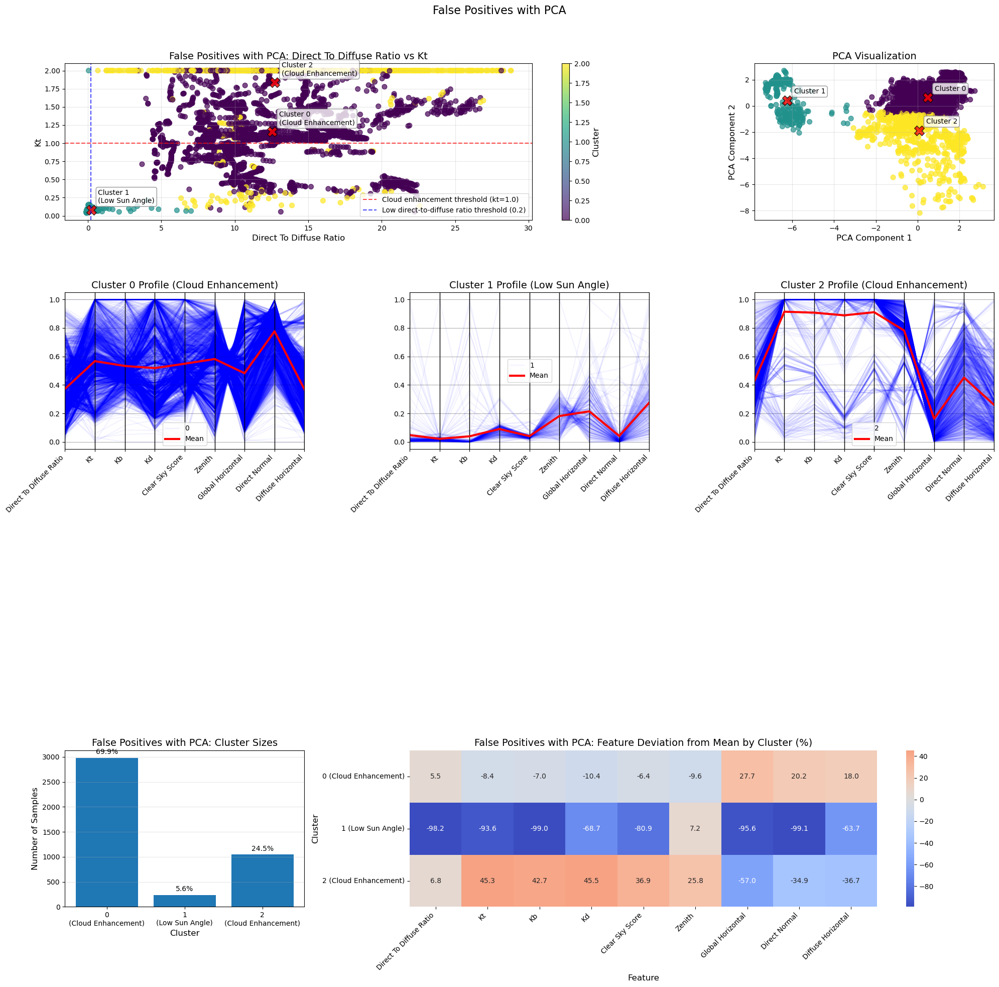


===== CLUSTERING FALSE_POSITIVES with UMAP =====
Found 4270 false_positives
Computing SHAP values for false_positives...
Normalizing data with 10 features...
Applying UMAP (n_neighbors=30, min_dist=0.1)...
Performing k-means clustering with 3 clusters...
Silhouette score: 0.5580
X_clustered NaN check:
Series([], dtype: int64)
Cluster 0 shape: (278, 56)
Cluster data NaN check:
Series([], dtype: int64)

Cluster 0: 278 samples (6.5%)
Pattern: Cloud Enhancement
Key feature means:
  direct_to_diffuse_ratio: 17.3254 (+45.7% from mean)
  kt: 2.0000 (+58.3% from mean)
  kb: 1.9990 (+54.3% from mean)
  kd: 2.0000 (+60.9% from mean)
  global_horizontal: 18.3970 (-95.0% from mean)
  direct_normal: 214.7918 (-69.4% from mean)
  diffuse_horizontal: 13.0107 (-80.3% from mean)
  clear_sky_score: 1.7979 (+47.2% from mean)
  zenith: 94.2277 (+37.1% from mean)
  kb_to_kd_ratio: 0.9995 (-15.1% from mean)
Pattern indicators:
  ✓ Shows cloud enhancement (kt > 1.0)
  ✓ High solar zenith angle (> 70°)

Repr

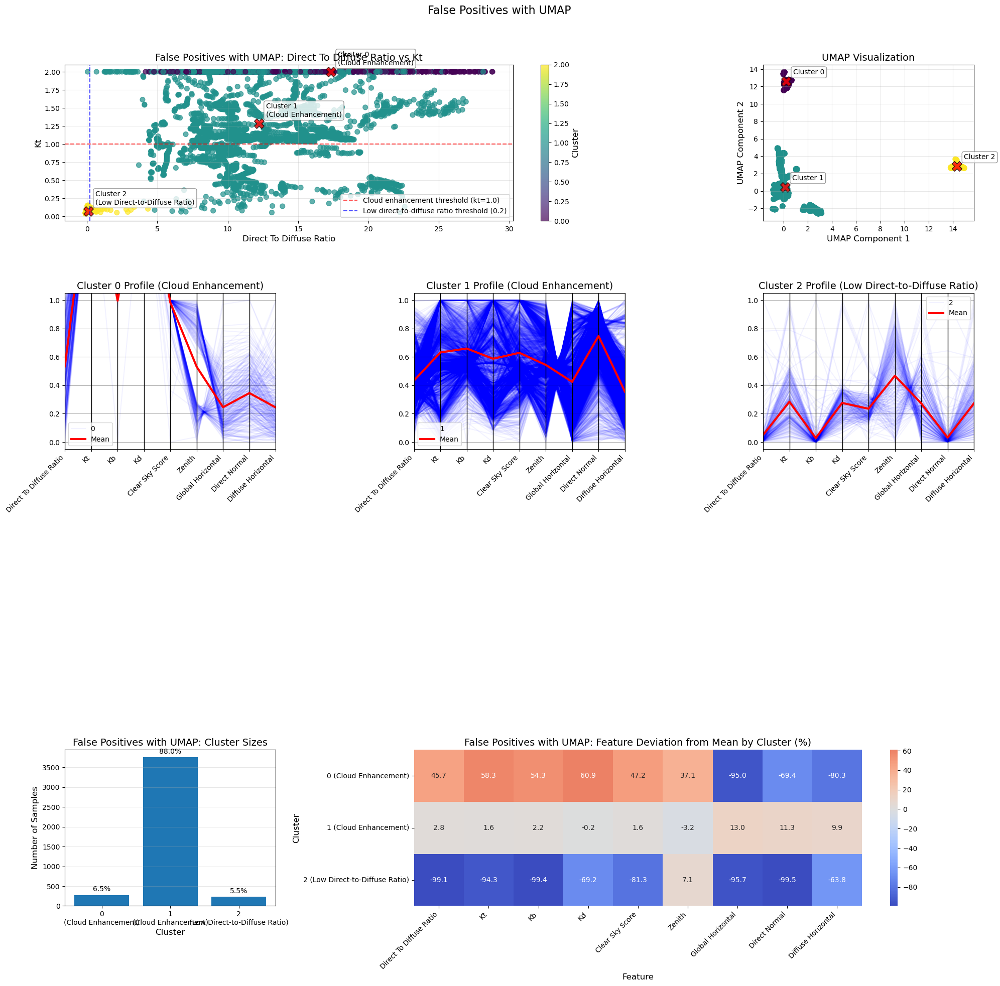

In [20]:
shap_explainer = ClearSkyShapExplainer(model)
cluster_results = shap_explainer.cluster_misclassifications(
    X_test, 
    y_test,
    n_clusters=3, 
    misclassification_type='false_positives',  # 'false_positives', 'false_negatives', or 'both'
    feature_subset=[
        'direct_to_diffuse_ratio', 'kt', 'kb', 'kd', 
        'global_horizontal', 'direct_normal', 'diffuse_horizontal',
        'zenith', 'kb_to_kd_ratio', 'clear_sky_score'
    ],
    dim_reduction_method='both',
    use_shap_values=True,  # Set to False to cluster on raw features instead of SHAP values
    random_state=41
)

Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians

Debug Information:
Total samples: 210059
Predicted positives (≥0.5): 31481
Actual positives(y=1): 29945
False positives: 4270
False negatives: 2734
False positive probabilities range: 0.500 - 0.997

DEBUG - False Positive Verification:
First 5 identified false positives:

Index 314:
Predicted probability: 0.604
Actual label (y): 0
Predicted label (y_pred): 1
Is false positive: True

Index 1142:
Predict

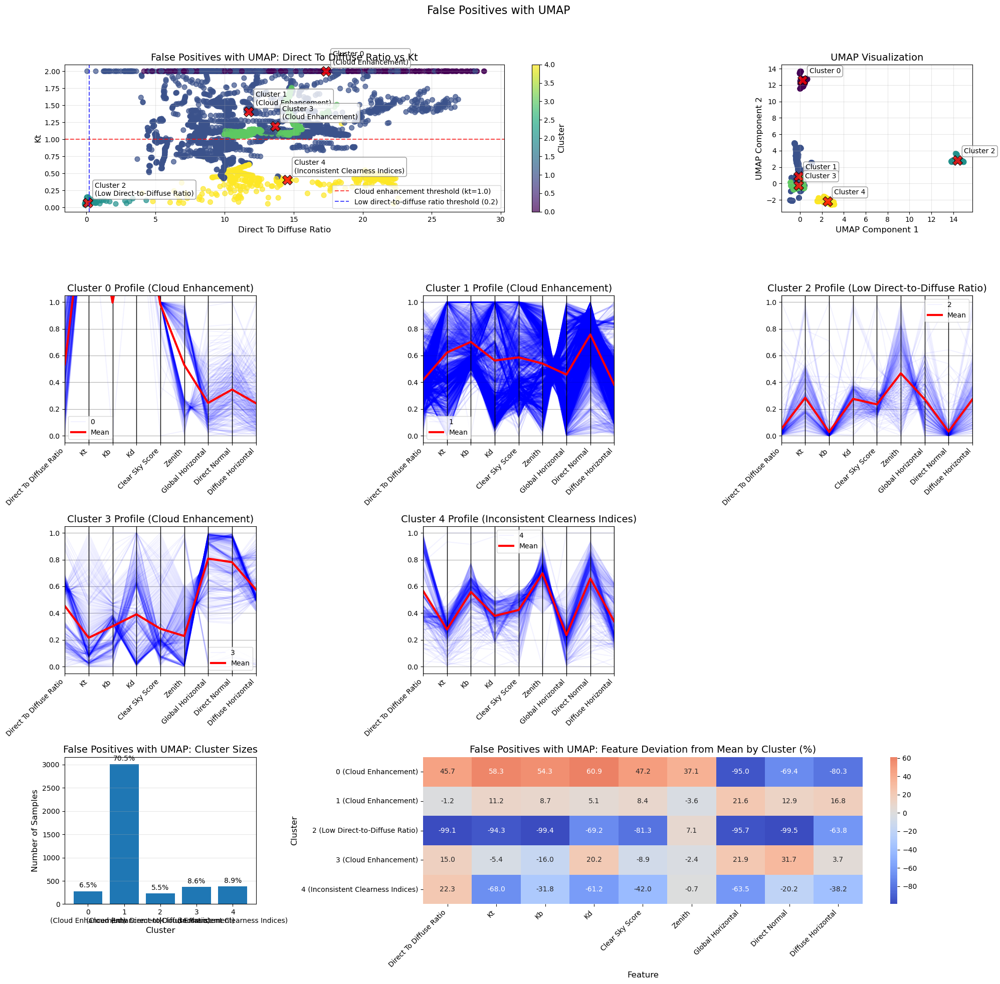

In [24]:
shap_explainer = ClearSkyShapExplainer(model)
umap_cluster_results = shap_explainer.cluster_misclassifications(
    X_test, 
    y_test,
    n_clusters=5, 
    misclassification_type='false_positives',  # 'false_positives', 'false_negatives', or 'both'
    feature_subset=[
        'direct_to_diffuse_ratio', 'kt', 'kb', 'kd', 
        'global_horizontal', 'direct_normal', 'diffuse_horizontal',
        'zenith', 'kb_to_kd_ratio', 'clear_sky_score'
    ],
    dim_reduction_method='umap',
    use_shap_values=True,  # Set to False to cluster on raw features instead of SHAP values
    random_state=41
)

# UMAP Clusters v.s. PCA Clusters

Findings from the results

1. Different clustering patterns between PCA and UMAP:

* With UMAP, you get a clearer separation of clusters (silhouette score 0.5580 vs 0.2391 for PCA)
* UMAP identifies one dominant cluster (Cluster 1: 88.0% of false positives)
* PCA distributes samples more evenly (Cluster 0: 69.9%, Cluster 2: 24.5%, Cluster 1: 5.6%)

2. Three distinct groups of false positives in UMAP:

* Cluster 0 (6.5%): High zenith angle (94.2°) cloud enhancement cases with very low irradiance values
* Cluster 1 (88.0%): Normal/moderate cloud enhancement with good irradiance values
* Cluster 2 (5.5%): Low direct-to-diffuse ratio cases with near zero direct irradiance

3. PCA clusters show slightly different grouping:

* Cluster 0 (69.9%): Moderate cloud enhancement cases
* Cluster 1 (5.6%): Low sun angle/dusk cases with very little direct irradiance
* Cluster 2 (24.5%): High zenith angle cloud enhancement cases

4. Irradiance patterns:

* Cloud enhancement is the dominant pattern in false positives (88% in UMAP, 69.9%+24.5% in PCA)
* A small percentage (~5.5%) are low direct-to-diffuse ratio cases at dawn/dusk

5. Interesting values for key features:

* Most false positives have clearness index (kt) > 1.0
* Many have high solar zenith angles (>70°)
* Some samples have negative direct_normal irradiance values, which is physically impossible and likely sensor error

6. Data quality:
* No NaN values were found in the clusters
* Some direct irradiance values are negative, which indicates measurement issues

These results demonstrate why UMAP is valuable - it provides better cluster separation for your false positive cases compared to PCA, highlighting more distinct patterns in the misclassifications. The improved silhouette score with UMAP (0.5580 vs 0.2391) indicates much clearer cluster boundaries.

Using temporary directory: /var/folders/zk/83r7bdpd2g11psvjbywlbxsr0000gn/T/tmpn07j_prb

=== Processing UMAP clusters ===
UMAP Cluster 0 (Cloud Enhancement) has 278 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi
UMAP Cluster 1 (Cloud Enhancement) has 3758 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi
UMAP Cluster 2 (Low Direct-to-Diffuse Ratio) has 234 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi

=== Processing PCA clusters ===
PCA Cluster 0 (Cloud Enhancement) has 2983 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi
PCA Cluster 1 (Low Sun Angle) has 240 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi

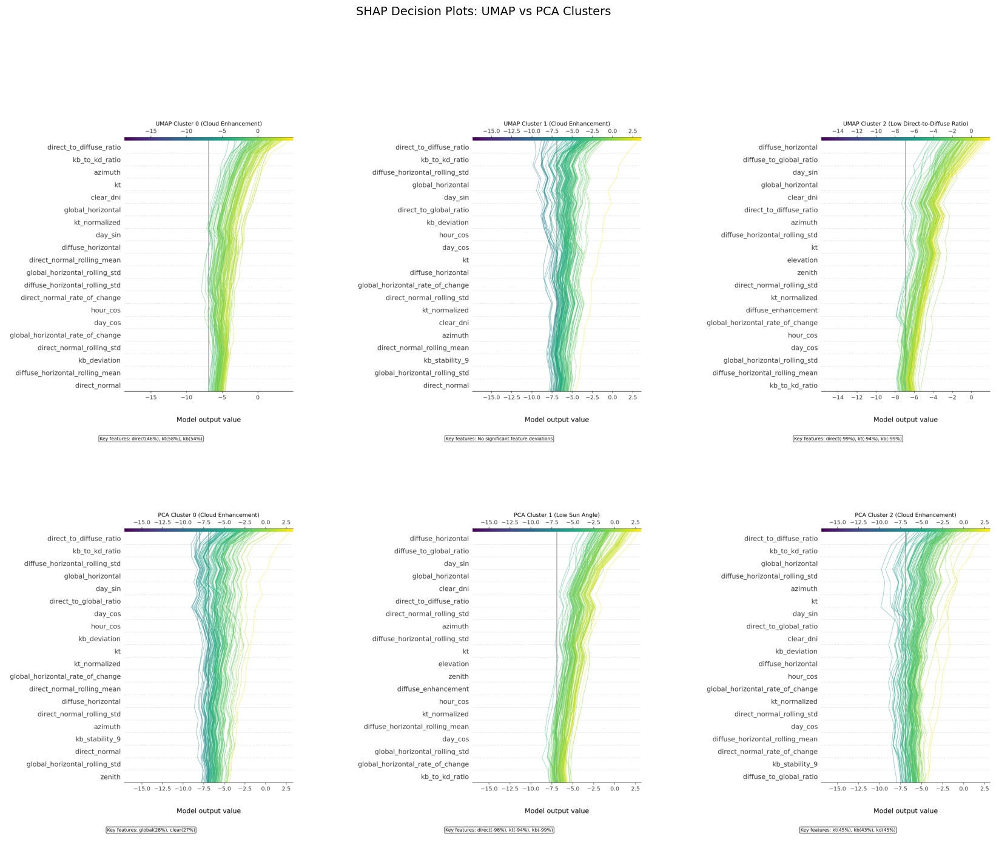

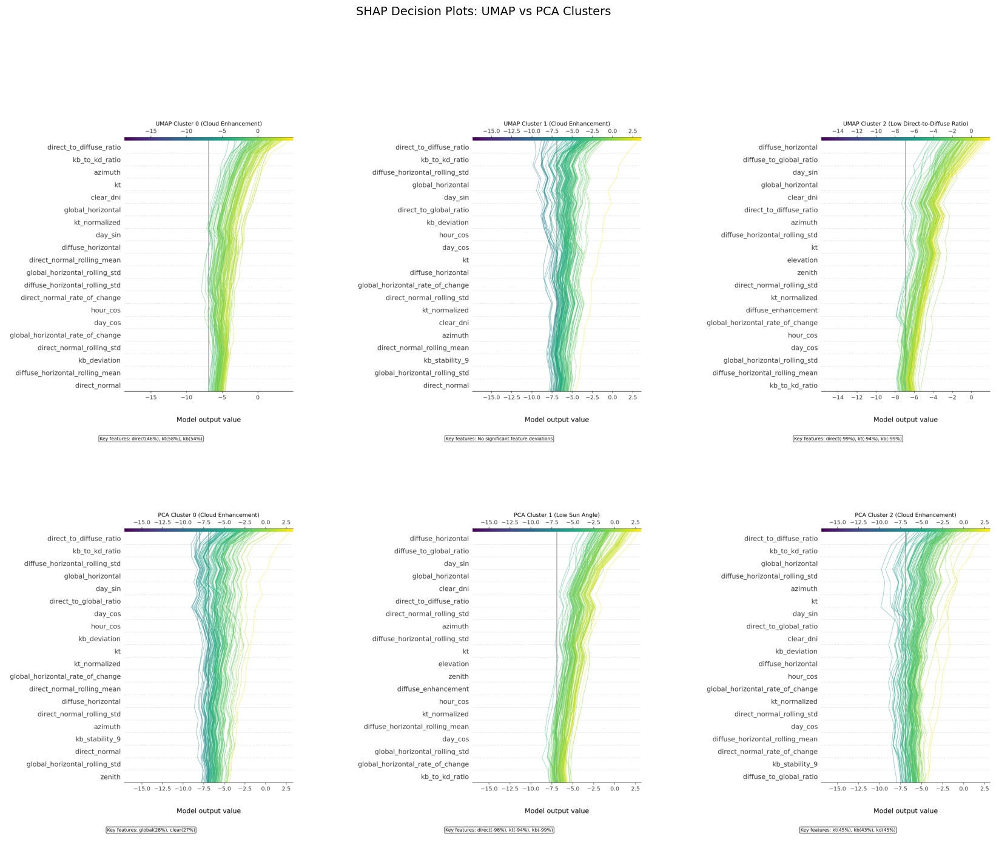

In [66]:
# Create decision plots for PCA clusters
# shap_explainer.clusters_with_decision_plot(
#     X_test, y_test, 
#     cluster_results, 
#     dim_method='pca',
#     samples_per_cluster=100
# )

# Create decision plots for UMAP clusters
shap_explainer.clusters_with_decision_plot(
    X_test, y_test, 
    cluster_results, 
    dim_method='both',
    samples_per_cluster=100
)

Using temporary directory: /var/folders/zk/83r7bdpd2g11psvjbywlbxsr0000gn/T/tmpvm_4a6k1

=== Processing UMAP clusters ===
UMAP Cluster 0 (Cloud Enhancement) has 278 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi
UMAP Cluster 1 (Cloud Enhancement) has 3009 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 60 NaNs in clear_dhi
UMAP Cluster 2 (Low Direct-to-Diffuse Ratio) has 234 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
UMAP Cluster 3 (Cloud Enhancement) has 367 samples
Using 100 samples for decision plot
Found 60 NaNs in clear_ghi
Found 60 NaNs in clear_dni
Found 

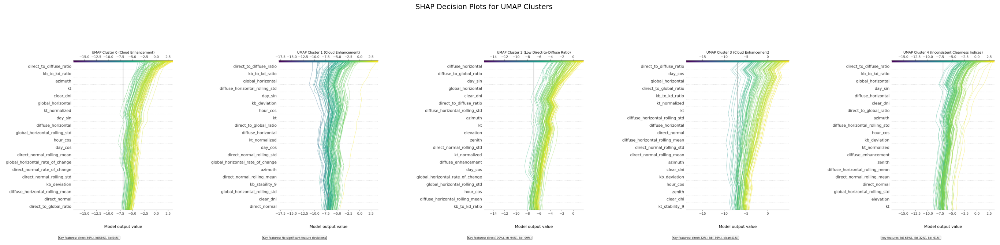

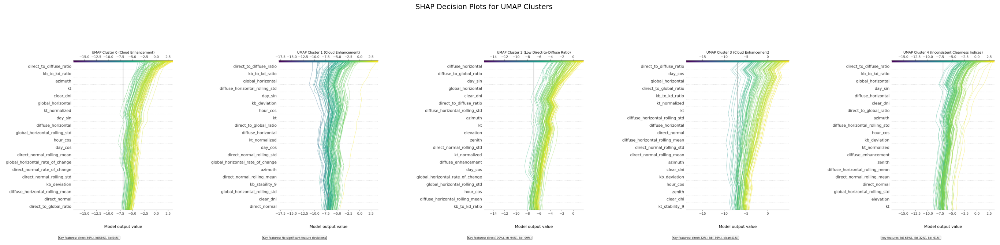

In [32]:
shap_explainer.clusters_with_decision_plot(
    X_test, y_test, 
    umap_cluster_results, 
    dim_method='umap',
    samples_per_cluster=100
)

# False cases on the timeseries

In [45]:
start_date = '2015-09-01'

# fig = shap_explainer.plot_false_positives_on_timeseries(
#     X_test, y_test, cluster_results, start_date, end_date,
#     misclassification_type='false_positives', dim_method='umap',
#     include_vars=['direct_normal', 'global_horizontal', 'kt', 'kb'],
#     dump_html=True, dump_dir='outputs/'
# )
fig = shap_explainer.plot_false_cases_on_timeseries(
    X_test, y_test, cluster_results, 
    init_start_date = start_date, window_size = 30,
    misclassification_type='false_positives', dim_method='umap',
    include_vars=['direct_normal', 'global_horizontal', 'kt', 'kb'],
    dump_html=True, dump_dir='outputs/'
)
fig.show()

X.index is timezone-aware: True
X.index timezone: America/Denver
Localizing start_date to timezone: America/Denver
Parsed start_date: 2015-09-01 00:00:00-06:00
X.index.min(): 2015-08-07 13:12:00-06:00
End date: 2015-12-31 00:00:00-07:00
Computing model predictions...
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
Found 4506 total false_positives in the dataset
Found 5 clusters for false_positives
Cluster 0 (Cloud Enhancement) has 278 samples
Cluster 1 (Cloud Enhancement) has 3009 samples
Cluster 2 (Low Direct-to-Diffuse Ratio) has 234 samples
Cluster 3 (Cloud Enhancement) has 367 samples
Cluster 4 (Inconsistent Clearness Indices) has 382 samples
Found 4267 timestamps with cluster assignments
Processing window 2015-09-01 to 2015-10-01
Window

From time series plots:

1. Cluster 1 false positives (blue dots) occur predominantly during peak irradiance periods, especially when:
* Direct normal irradiance (blue line) shows sharp, high peaks
* These appear as vertical groupings of blue dots that form columns at irradiance peaks
* Most visible on days with intermittent clouds (like Oct 7-10, Sept 4-6, Sept 13-15)
* They often appear when the direct normal irradiance exceeds the global horizontal, indicating potential cloud enhancement effects

2. Cluster 0 false positives (red dots) are more scattered and tend to appear:
* At the shoulders of daily irradiance curves (morning/evening)
* When direct normal has moderate values but global horizontal is very low
* Particularly visible in early morning periods (Sept 7, Oct 4, Oct 28-30)
* Often isolated rather than in dense groups like Cluster 1

3. Cluster 2 false positives (green dots) are sparse but notably present:
* At the very beginning or end of daylight periods
* When diffuse irradiance dominates over direct irradiance
* Visible as isolated green dots near the x-axis (Sept 13-14, Sept 26-27, Oct 13-15)
* Often occur during periods when direct normal irradiance drops rapidly while global horizontal maintains some value

4. Temporal distribution patterns:

* The September dataset shows more consistent false positive patterns across all days
* The October-November dataset shows more clustering of false positives on specific days (Oct 7-11, Oct 25-30)
* False positives tend to cluster around transition zones between clearly sunny periods and cloudy periods

5. Daily patterns:
* Morning periods show more Cluster 0 (red) false positives
* Midday shows predominantly Cluster 1 (blue) false positives
* Late afternoon/evening transitions show a mix of all three clusters

The time series visualization reveals that the false positives aren't randomly distributed but follow specific patterns tied to solar position and cloud conditions. The UMAP clustering has effectively separated these temporally distinct events, showing that the classifier struggles with specific irradiance conditions that occur at different times of the day.

# Implement it

Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians
0:	learn: 0.9464435	test: 0.9322365	best: 0.9322365 (0)	total: 1.19s	remaining: 19m 44s
100:	learn: 0.9672419	test: 0.9525882	best: 0.9525882 (100)	total: 1m 7s	remaining: 10m 2s
200:	learn: 0.9727506	test: 0.9607317	best: 0.9607317 (200)	total: 2m 2s	remaining: 8m 5s
300:	learn: 0.9765713	test: 0.9657698	best: 0.9657698 (300)	total: 2m 56s	remaining: 6m 50s
400:	learn: 0.9793657	test: 0.9701312	best: 0

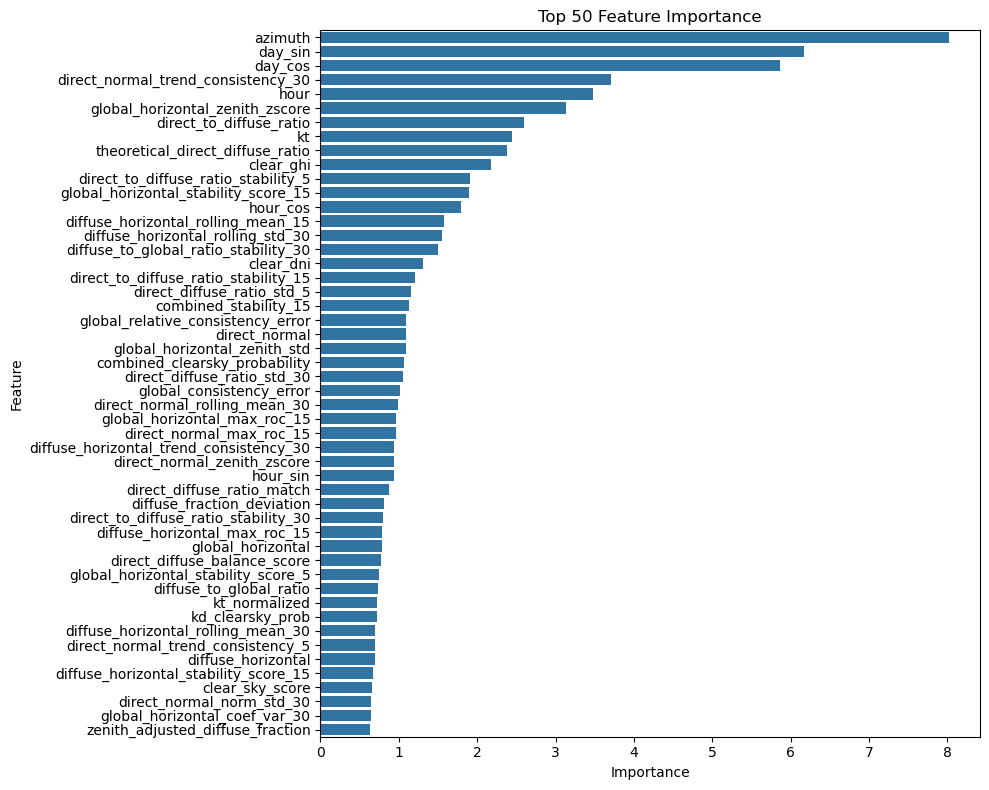

Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians


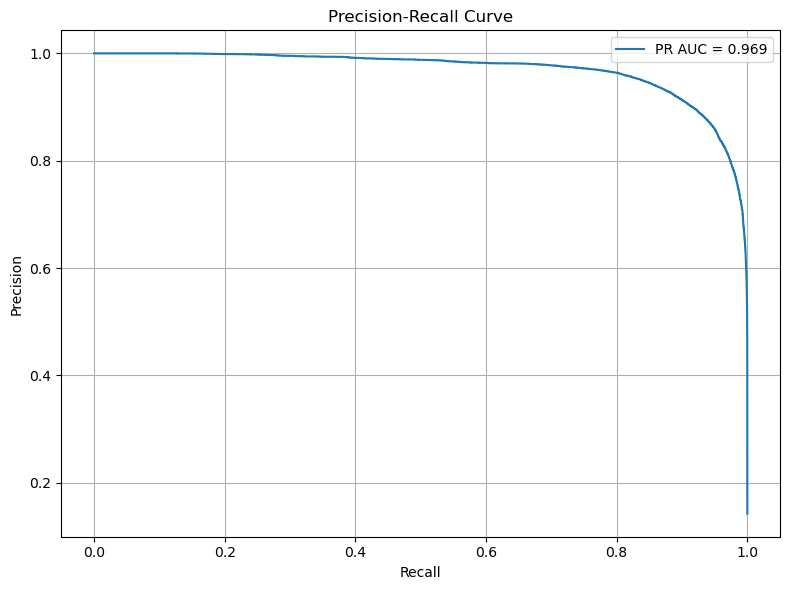


Analyzing model performance and errors...
Found 60 NaNs in clear_ghi
Successfully filled all 60 NaNs in clear_ghi with nearby zenith medians
Found 60 NaNs in clear_dni
Successfully filled all 60 NaNs in clear_dni with nearby zenith medians
Found 60 NaNs in clear_dhi
Successfully filled all 60 NaNs in clear_dhi with nearby zenith medians


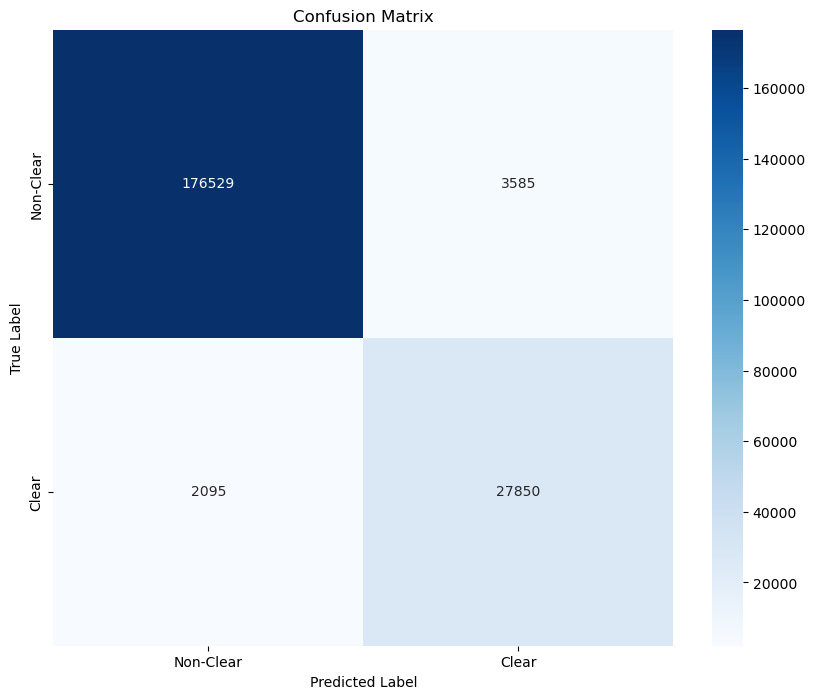

Total samples: 210059
True Negatives: 176529 (84.04%)
False Positives: 3585 (1.71%)
False Negatives: 2095 (1.00%)
True Positives: 27850 (13.26%)

Metrics:
Accuracy: 0.9730
Precision: 0.8860
Recall: 0.9300
Specificity: 0.9801
False Positive Rate: 0.0199
False Negative Rate: 0.0700


In [49]:
from pvc.clear_sky_classifier_v3 import ClearSkyClassifierV3


data_path = "./Clearsky-Labeled-Data-Set/labeled_clearsky_data.csv"
model3 = ClearSkyClassifierV3(
    model_params={
        'iterations': 1000,
        'learning_rate': 0.05,  
        'depth': 5, # 6
        'l2_leaf_reg': 3,
        'eval_metric': 'F1',
        'early_stopping_rounds': 150,
        'loss_function': 'Logloss',
        'auto_class_weights': 'Balanced',
        'random_seed': 41,
        'verbose': 100
    },
    
    feature_engineering=True,
    handle_imbalance=True,
    latitude=39.7420,   
    longitude=-105.1778,
    altitude=1829,
    timezone='America/Denver'
)
model3, X_test, y_test = train_clear_sky_model(data_path, timezone, model3)

Performance Comparison
| Metric | V0 | V2 | V3 |
|--------|----------|-----|-------------|
| Accuracy | 0.9664 | 0.9722 | 0.9730 |
| Precision | 0.8587 | 0.8844 | 0.8860 |
| Recall | 0.9146 | 0.9263 | 0.9300 |
| False Positive Rate | 0.0250 | 0.0201 | 0.0199 |
| False Negative Rate | 0.0854 | 0.0737 | 0.0700 |